In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os


import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision


from IPython.display import display
from PIL import Image
from pathlib import Path
from tqdm import tqdm


from torchvision import transforms, utils
from torch.utils.data import Dataset, DataLoader


/Users/michael/opt/anaconda3/envs/Pytorch/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Utility

In [2]:
def show_img(img_tensor):
    to_pil = transforms.ToPILImage()
    img = to_pil(img_tensor.to(torch.uint8))
    # img = to_pil(img_tensor)
    display(img)
    return img

def load_group_img_files(working_path, file_name_pattern):
    img_files = working_path.glob(file_name_pattern)
    img_files = [str(img_file) for img_file in img_files]
    img_files = sorted(img_files)
    return img_files

def jpg_to_jpeg(jpg_file):
    try:
        image = cv2.imread(jpg_file)

        jpg_file_path = Path(jpg_file)
        jpeg_file_path = jpg_file_path.parent / f'{jpg_file_path.stem}.jpeg'

        cv2.imwrite(str(jpeg_file_path), image)
        # print(jpeg_file_path)
    except Exception as exp:
        print(exp)
        
def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

In [3]:
category_mapping = {0:'CAT', 1: 'DOG', 2: 'PERSON'}

def prediction_to_prob(prediction):
    t1 = torch.tensor(prediction).exp()
    t2 = t1.sum()    
    prob_dist = t1 / t2
    prob = prob_dist[prob_dist.argmax().item()]
    category = category_mapping[prob_dist.argmax().item()]
    
    return category, prob, prob_dist

In [4]:
IMG_DATASET_ROOT_PATH = Path('/Users/michael/Datasets/Images')
IMG_DATASET_CAT_PATH = IMG_DATASET_ROOT_PATH / "Cat"
IMG_DATASET_DOG_PATH = IMG_DATASET_ROOT_PATH / "Dog"

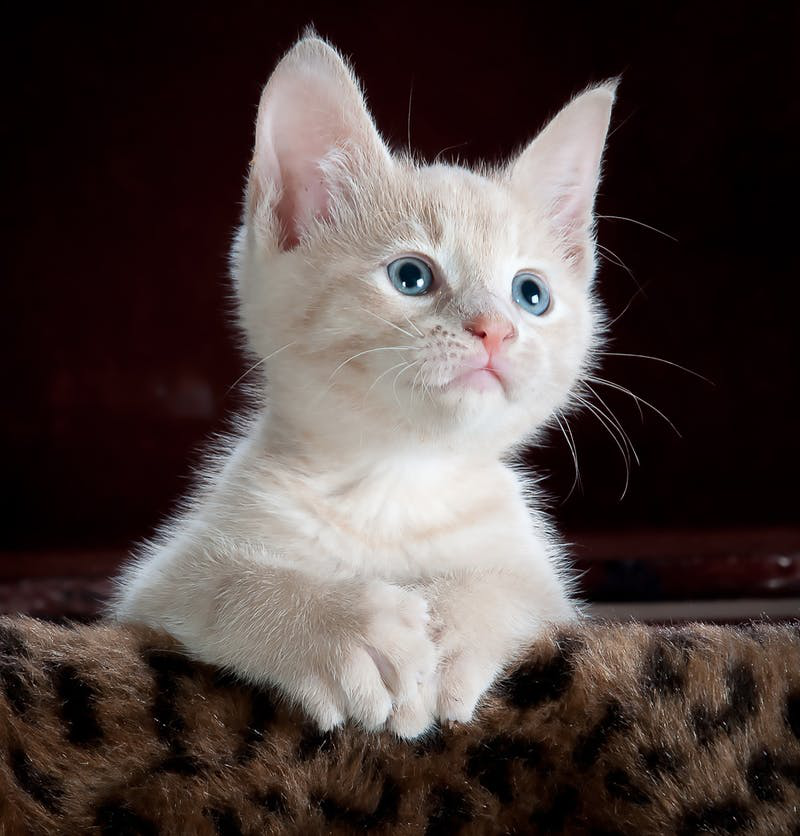

In [5]:
pil_im = Image.open(IMG_DATASET_ROOT_PATH / 'Cat1.jpeg')
display(pil_im)

In [6]:
IMG_DATASET_ROOT_PATH / "Cat/0.jpeg"

PosixPath('/Users/michael/Datasets/Images/Cat/0.jpeg')

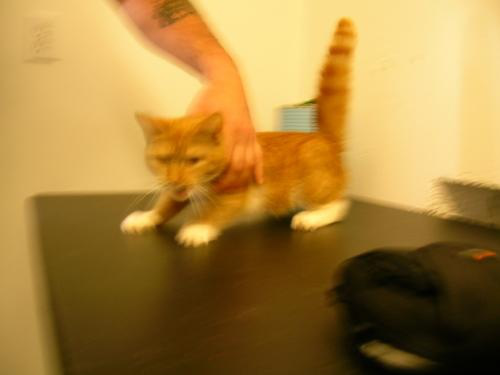

In [7]:
img_tensor = torchvision.io.read_image(str(IMG_DATASET_CAT_PATH / "0.jpeg"))
i = show_img(img_tensor)

In [8]:
img_tensor.size()

torch.Size([3, 375, 500])

In [9]:
img_tensor

tensor([[[203, 203, 204,  ..., 240, 239, 238],
         [203, 203, 204,  ..., 240, 239, 239],
         [203, 203, 204,  ..., 241, 239, 239],
         ...,
         [153, 153, 153,  ...,   2,   2,   2],
         [152, 152, 152,  ...,   1,   1,   1],
         [151, 151, 152,  ...,   1,   1,   1]],

        [[164, 164, 165,  ..., 201, 200, 199],
         [164, 164, 165,  ..., 201, 200, 200],
         [164, 164, 165,  ..., 202, 200, 200],
         ...,
         [122, 122, 122,  ...,   2,   2,   2],
         [121, 121, 121,  ...,   1,   1,   1],
         [120, 120, 121,  ...,   1,   1,   1]],

        [[ 87,  87,  88,  ..., 122, 121, 120],
         [ 87,  87,  88,  ..., 122, 121, 121],
         [ 87,  87,  88,  ..., 123, 121, 121],
         ...,
         [ 55,  55,  55,  ...,   0,   0,   0],
         [ 54,  54,  54,  ...,   0,   0,   0],
         [ 53,  53,  54,  ...,   0,   0,   0]]], dtype=torch.uint8)

In [10]:
working_path = Path(".")

# Training Data

In [11]:
l = list(range(10))
l, l[3:]

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], [3, 4, 5, 6, 7, 8, 9])

In [138]:
# cat_img_files = load_group_img_files(working_path, "images/Cat*.jpeg")
# dog_img_files = load_group_img_files(working_path, "images/Dog*.jpeg")
# person_img_files = load_group_img_files(working_path, "images/human*.jpeg")
# len(cat_img_files), len(dog_img_files), len(person_img_files)

# cat train/val split 
split = 0.9
cat_img_files = load_group_img_files(IMG_DATASET_CAT_PATH, "*.jpeg")
train_count = int(len(cat_img_files) * split)
# val_count = len(cat_img_files) - train_count
cat_img_train_files = cat_img_files[:train_count]
cat_img_val_files = cat_img_files[train_count:]

# dog train/val split 
dog_img_files = load_group_img_files(IMG_DATASET_DOG_PATH, "*.jpeg")
train_count = int(len(dog_img_files) * split)
dog_img_train_files = dog_img_files[:train_count]
dog_img_val_files = dog_img_files[train_count:]

# cat test 
cat_img_test_files = load_group_img_files(IMG_DATASET_ROOT_PATH, "Cat*.jpeg")

# dog test 
dog_img_test_files = load_group_img_files(IMG_DATASET_ROOT_PATH, "Dog*.jpeg")

# person
person_img_files = []
person_img_train_files = []
person_img_val_files = []
person_img_test_files = []

len(cat_img_files), len(dog_img_files), len(person_img_files), len(cat_img_test_files), len(dog_img_test_files),len(person_img_test_files),\
len(cat_img_train_files), len(cat_img_val_files), len(dog_img_train_files), len(dog_img_val_files)

(12476, 12470, 0, 99, 99, 0, 11228, 1248, 11223, 1247)

In [139]:
class MichaelImageDataset(Dataset):
    CAT = 0
    DOG = 1
    PERSON = 2
    
    def __init__(self, cat_img_files, dog_img_files, person_img_files, transforms=None):
        self.cat_img_files = cat_img_files
        self.dog_img_files = dog_img_files
        self.person_img_files = person_img_files
        self.all_img_files = cat_img_files + dog_img_files + person_img_files
        self.transforms = transforms
        
    def __len__(self):
        return len(self.all_img_files)
    
    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        img_name = self.all_img_files[idx]
        image = torchvision.io.read_image(img_name)
        
        if idx < len(self.cat_img_files):
            label = MichaelImageDataset.CAT
        elif idx < len(self.cat_img_files) + len(self.dog_img_files):
            label = MichaelImageDataset.DOG
        else:
            label = MichaelImageDataset.PERSON
        
        image = image.float() / 255.0 # normalize to: [0.0, 1.0]
        if self.transforms is not None:
            image = self.transforms(image)
            
            
        #sample = {'image': image, 'label': label}

        return image, label
    

In [140]:
size = (300,400)

transform = transforms.Compose(
    [transforms.Resize(size),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_dataset = MichaelImageDataset(cat_img_train_files, dog_img_train_files, person_img_train_files, transform)

val_dataset = MichaelImageDataset(cat_img_val_files, dog_img_val_files, person_img_val_files, transform)

test_dataset = MichaelImageDataset(cat_img_test_files, dog_img_test_files, person_img_test_files, transform)

In [141]:
len(train_dataset), len(val_dataset), len(test_dataset)

(22451, 2495, 198)

In [142]:
img_tensor, label = train_dataset[0]
img_tensor, label

(tensor([[[ 0.5922,  0.5951,  0.6049,  ...,  0.8873,  0.8775,  0.8685],
          [ 0.5922,  0.5951,  0.6049,  ...,  0.8884,  0.8786,  0.8745],
          [ 0.5922,  0.5951,  0.6049,  ...,  0.8933,  0.8835,  0.8751],
          ...,
          [ 0.2006,  0.2049,  0.2049,  ..., -0.9843, -0.9843, -0.9843],
          [ 0.1951,  0.1951,  0.1982,  ..., -0.9892, -0.9892, -0.9892],
          [ 0.1853,  0.1879,  0.1928,  ..., -0.9922, -0.9922, -0.9922]],
 
         [[ 0.2863,  0.2892,  0.2990,  ...,  0.5814,  0.5716,  0.5626],
          [ 0.2863,  0.2892,  0.2990,  ...,  0.5825,  0.5727,  0.5686],
          [ 0.2863,  0.2892,  0.2990,  ...,  0.5874,  0.5776,  0.5692],
          ...,
          [-0.0425, -0.0382, -0.0382,  ..., -0.9843, -0.9843, -0.9843],
          [-0.0480, -0.0480, -0.0450,  ..., -0.9892, -0.9892, -0.9892],
          [-0.0578, -0.0553, -0.0504,  ..., -0.9922, -0.9922, -0.9922]],
 
         [[-0.3176, -0.3147, -0.3049,  ..., -0.0382, -0.0480, -0.0570],
          [-0.3176, -0.3147,

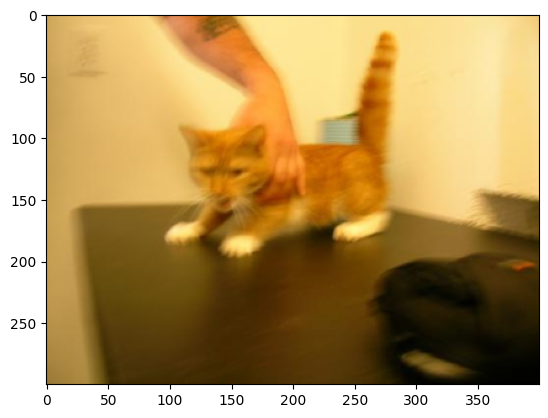

In [143]:
imshow(img_tensor)

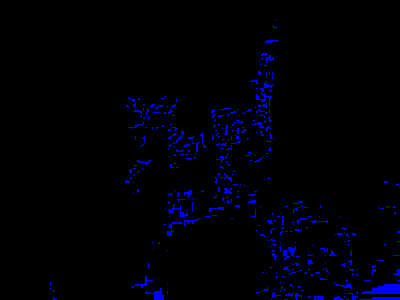

In [144]:
i = show_img(img_tensor)

In [145]:
img_tensor.size()

torch.Size([3, 300, 400])

In [146]:
train_dataloader = DataLoader(train_dataset, batch_size=40, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=40, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=40, shuffle=True)

In [147]:
train_features, train_labels = next(iter(train_dataloader))
print(f"Feature batch shape: {train_features.size()}")
print(f"Labels batch shape: {train_labels.size()}")

Feature batch shape: torch.Size([40, 3, 300, 400])
Labels batch shape: torch.Size([40])


In [148]:
train_features.size()

torch.Size([40, 3, 300, 400])

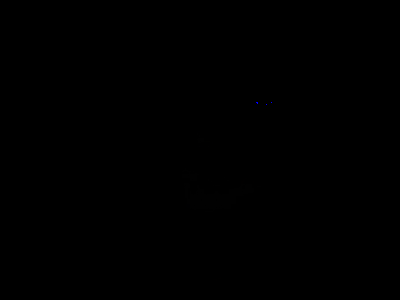

In [149]:
i = show_img(train_features[0])

# Model & Training

In [150]:
class Net_V1(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 6, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(6, 16, 5)
        # self.fc1 = nn.Linear(16 * 5 * 5, 120) #change
        self.fc1 = nn.Linear(111744, 120) #change
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 2)

    def forward(self, x):
        # print(f'input: {x.size()}')
        x = self.pool(F.relu(self.conv1(x)))
        # print(f'l3: {x.size()}')
        x = self.pool(F.relu(self.conv2(x)))
        # print(f'l6: {x.size()}')
        x = torch.flatten(x, 1) # flatten all dimensions except batch
        # print(f'l7: {x.size()}')
        
        x = F.relu(self.fc1(x))
        # print(f'l8: {x.size()}')
        x = F.relu(self.fc2(x))
        # print(f'l9: {x.size()}')
        
        x = self.fc3(x)
        # print(f'l10: {x.size()}')
        
        return x


class Net_V2(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 6, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.conv3 = nn.Conv2d(16, 10, 5)
        # self.fc1 = nn.Linear(16 * 5 * 5, 120) #change
        self.fc1 = nn.Linear(15640, 120) #change
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 2)

    def forward(self, x):
        # print(f'input: {x.size()}')
        x = self.pool(F.relu(self.conv1(x)))
        # print(f'l3: {x.size()}')
        x = self.pool(F.relu(self.conv2(x)))
        # print(f'l6: {x.size()}')
        x = self.pool(F.relu(self.conv3(x)))
        x = torch.flatten(x, 1) # flatten all dimensions except batch
        # print(f'l7: {x.size()}')
        
        x = F.relu(self.fc1(x))
        # print(f'l8: {x.size()}')
        x = F.relu(self.fc2(x))
        # print(f'l9: {x.size()}')
        
        x = self.fc3(x)
        # print(f'l10: {x.size()}')
        
        return x


class Net_V3(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 6, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.conv3 = nn.Conv2d(16, 10, 5)
        self.conv4 = nn.Conv2d(10, 10, 5)
        self.conv5 = nn.Conv2d(10, 10, 5)
        # self.fc1 = nn.Linear(16 * 5 * 5, 120) #change
        self.fc1 = nn.Linear(400, 120) #change
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 2)

    def forward(self, x):
        # print(f'input: {x.size()}')
        x = self.pool(F.relu(self.conv1(x)))
        # print(f'l3: {x.size()}')
        x = self.pool(F.relu(self.conv2(x)))
        # print(f'l6: {x.size()}')
        x = self.pool(F.relu(self.conv3(x)))
        x = self.pool(F.relu(self.conv4(x)))
        x = self.pool(F.relu(self.conv5(x)))
        
        x = torch.flatten(x, 1) # flatten all dimensions except batch
        # print(f'l7: {x.size()}')
        
        x = F.relu(self.fc1(x))
        # print(f'l8: {x.size()}')
        x = F.relu(self.fc2(x))
        # print(f'l9: {x.size()}')
        
        x = self.fc3(x)
        # print(f'l10: {x.size()}')
        
        return x
    
class Net_V4(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 6, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.conv3 = nn.Conv2d(16, 32, 5)
        # self.fc1 = nn.Linear(16 * 5 * 5, 120) #change
        self.fc1 = nn.Linear(50048, 120) #change
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 2)

    def forward(self, x):
        # print(f'input: {x.size()}')
        x = self.pool(F.relu(self.conv1(x)))
        # print(f'l3: {x.size()}')
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))
        # print(f'l6: {x.size()}')
        
        x = torch.flatten(x, 1) # flatten all dimensions except batch
        # print(f'l7: {x.size()}')
        
        x = F.relu(self.fc1(x))
        # print(f'l8: {x.size()}')
        x = F.relu(self.fc2(x))
        # print(f'l9: {x.size()}')
        
        x = self.fc3(x)
        # print(f'l10: {x.size()}')
        
        return x

In [151]:
net = Net_V1() #change NN version/type

In [152]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9)

In [155]:
def train_one_epoch(epoch):
    net.train()
    
    running_loss = 0.0
    for i, data in tqdm(enumerate(train_dataloader, 0), total=len(train_dataloader)):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        if i % 10 == 9:    # print every 10 mini-batches
            print(f'[{epoch + 1}, {i + 1:5d}] loss: {loss.item() / 10:.3f} running_loss: {running_loss / 10:.3f}')
            running_loss = 0.0

def val_one_epoch(epoch):
    net.eval()
    
    with torch.no_grad():
        total = 0
        right = 0
        for imgs, labels in tqdm(val_dataloader, total=len(train_dataloader)):
            predictions = net(imgs)
            # print(labels)

            # show_img(imgs[0])
            for prediction, label in zip(predictions, labels):
                predict_category, predict_prob, predict_prob_dist = prediction_to_prob(prediction)
                total += 1

                label_category = category_mapping[int(label.item())]
                # right += 1 if label_cateogry == predict_category else 0
                if label_category == predict_category:
                    right += 1

        accuracy = right/total
        print(f'epoch: {epoch}, total: {total}, right: {right}, accuracy: {accuracy}')
    
    
for epoch in range(10):  # loop over the dataset multiple times
    train_one_epoch(epoch)
    
    val_one_epoch(epoch)

            
print('Finished Training')

  2%|█▊                                                                                                    | 10/562 [00:11<08:26,  1.09it/s]

[1,    10] loss: 0.016 running_loss: 0.131


  4%|███▋                                                                                                  | 20/562 [00:19<07:06,  1.27it/s]

[1,    20] loss: 0.008 running_loss: 0.133


  5%|█████▍                                                                                                | 30/562 [00:27<07:05,  1.25it/s]

[1,    30] loss: 0.009 running_loss: 0.098


  7%|███████▎                                                                                              | 40/562 [00:34<06:48,  1.28it/s]

[1,    40] loss: 0.006 running_loss: 0.083


  9%|█████████                                                                                             | 50/562 [00:43<06:47,  1.26it/s]

[1,    50] loss: 0.008 running_loss: 0.069


 11%|██████████▉                                                                                           | 60/562 [00:50<06:30,  1.29it/s]

[1,    60] loss: 0.013 running_loss: 0.101


 12%|████████████▋                                                                                         | 70/562 [00:58<06:23,  1.28it/s]

[1,    70] loss: 0.004 running_loss: 0.057


 14%|██████████████▌                                                                                       | 80/562 [01:07<07:23,  1.09it/s]

[1,    80] loss: 0.009 running_loss: 0.082


 16%|████████████████▎                                                                                     | 90/562 [01:18<07:53,  1.00s/it]

[1,    90] loss: 0.001 running_loss: 0.104


 18%|█████████████████▉                                                                                   | 100/562 [01:27<06:53,  1.12it/s]

[1,   100] loss: 0.014 running_loss: 0.084


 20%|███████████████████▊                                                                                 | 110/562 [01:35<06:14,  1.21it/s]

[1,   110] loss: 0.001 running_loss: 0.054


 21%|█████████████████████▌                                                                               | 120/562 [01:44<06:09,  1.20it/s]

[1,   120] loss: 0.009 running_loss: 0.067


 23%|███████████████████████▎                                                                             | 130/562 [01:52<05:54,  1.22it/s]

[1,   130] loss: 0.010 running_loss: 0.091


 25%|█████████████████████████▏                                                                           | 140/562 [02:01<05:58,  1.18it/s]

[1,   140] loss: 0.007 running_loss: 0.079


 27%|██████████████████████████▉                                                                          | 150/562 [02:09<06:02,  1.14it/s]

[1,   150] loss: 0.004 running_loss: 0.087


 28%|████████████████████████████▊                                                                        | 160/562 [02:18<05:23,  1.24it/s]

[1,   160] loss: 0.004 running_loss: 0.111


 30%|██████████████████████████████▌                                                                      | 170/562 [02:26<05:21,  1.22it/s]

[1,   170] loss: 0.006 running_loss: 0.116


 32%|████████████████████████████████▎                                                                    | 180/562 [02:34<05:14,  1.21it/s]

[1,   180] loss: 0.016 running_loss: 0.125


 34%|██████████████████████████████████▏                                                                  | 190/562 [02:42<05:07,  1.21it/s]

[1,   190] loss: 0.009 running_loss: 0.069


 36%|███████████████████████████████████▉                                                                 | 200/562 [02:50<04:45,  1.27it/s]

[1,   200] loss: 0.009 running_loss: 0.085


 37%|█████████████████████████████████████▋                                                               | 210/562 [02:58<04:40,  1.25it/s]

[1,   210] loss: 0.007 running_loss: 0.096


 39%|███████████████████████████████████████▌                                                             | 220/562 [03:06<04:30,  1.26it/s]

[1,   220] loss: 0.004 running_loss: 0.069


 41%|█████████████████████████████████████████▎                                                           | 230/562 [03:14<04:37,  1.20it/s]

[1,   230] loss: 0.007 running_loss: 0.084


 43%|███████████████████████████████████████████▏                                                         | 240/562 [03:23<04:22,  1.23it/s]

[1,   240] loss: 0.010 running_loss: 0.079


 44%|████████████████████████████████████████████▉                                                        | 250/562 [03:31<04:09,  1.25it/s]

[1,   250] loss: 0.015 running_loss: 0.101


 46%|██████████████████████████████████████████████▋                                                      | 260/562 [03:39<03:57,  1.27it/s]

[1,   260] loss: 0.009 running_loss: 0.077


 48%|████████████████████████████████████████████████▌                                                    | 270/562 [03:47<03:58,  1.22it/s]

[1,   270] loss: 0.011 running_loss: 0.078


 50%|██████████████████████████████████████████████████▎                                                  | 280/562 [03:55<04:35,  1.02it/s]

[1,   280] loss: 0.007 running_loss: 0.089


 52%|████████████████████████████████████████████████████                                                 | 290/562 [04:05<03:49,  1.19it/s]

[1,   290] loss: 0.012 running_loss: 0.104


 53%|█████████████████████████████████████████████████████▉                                               | 300/562 [04:13<03:38,  1.20it/s]

[1,   300] loss: 0.007 running_loss: 0.117


 55%|███████████████████████████████████████████████████████▋                                             | 310/562 [04:21<03:29,  1.20it/s]

[1,   310] loss: 0.017 running_loss: 0.126


 57%|█████████████████████████████████████████████████████████▌                                           | 320/562 [04:30<03:31,  1.14it/s]

[1,   320] loss: 0.017 running_loss: 0.069


 59%|███████████████████████████████████████████████████████████▎                                         | 330/562 [04:39<03:12,  1.20it/s]

[1,   330] loss: 0.010 running_loss: 0.132


 60%|█████████████████████████████████████████████████████████████                                        | 340/562 [04:47<02:57,  1.25it/s]

[1,   340] loss: 0.012 running_loss: 0.101


 62%|██████████████████████████████████████████████████████████████▉                                      | 350/562 [04:55<03:07,  1.13it/s]

[1,   350] loss: 0.008 running_loss: 0.128


 64%|████████████████████████████████████████████████████████████████▋                                    | 360/562 [05:04<02:59,  1.12it/s]

[1,   360] loss: 0.006 running_loss: 0.112


 66%|██████████████████████████████████████████████████████████████████▍                                  | 370/562 [05:14<03:01,  1.06it/s]

[1,   370] loss: 0.023 running_loss: 0.133


 68%|████████████████████████████████████████████████████████████████████▎                                | 380/562 [05:22<02:31,  1.21it/s]

[1,   380] loss: 0.005 running_loss: 0.096


 69%|██████████████████████████████████████████████████████████████████████                               | 390/562 [05:30<02:24,  1.19it/s]

[1,   390] loss: 0.002 running_loss: 0.108


 71%|███████████████████████████████████████████████████████████████████████▉                             | 400/562 [05:38<02:10,  1.24it/s]

[1,   400] loss: 0.022 running_loss: 0.113


 73%|█████████████████████████████████████████████████████████████████████████▋                           | 410/562 [05:47<02:16,  1.11it/s]

[1,   410] loss: 0.007 running_loss: 0.155


 75%|███████████████████████████████████████████████████████████████████████████▍                         | 420/562 [05:57<02:49,  1.19s/it]

[1,   420] loss: 0.015 running_loss: 0.171


 77%|█████████████████████████████████████████████████████████████████████████████▎                       | 430/562 [06:06<02:03,  1.07it/s]

[1,   430] loss: 0.017 running_loss: 0.125


 78%|███████████████████████████████████████████████████████████████████████████████                      | 440/562 [06:15<01:41,  1.20it/s]

[1,   440] loss: 0.005 running_loss: 0.148


 80%|████████████████████████████████████████████████████████████████████████████████▊                    | 450/562 [06:23<01:37,  1.14it/s]

[1,   450] loss: 0.008 running_loss: 0.099


 82%|██████████████████████████████████████████████████████████████████████████████████▋                  | 460/562 [06:32<01:31,  1.11it/s]

[1,   460] loss: 0.023 running_loss: 0.117


 84%|████████████████████████████████████████████████████████████████████████████████████▍                | 470/562 [06:41<01:16,  1.20it/s]

[1,   470] loss: 0.015 running_loss: 0.092


 85%|██████████████████████████████████████████████████████████████████████████████████████▎              | 480/562 [06:49<01:07,  1.21it/s]

[1,   480] loss: 0.009 running_loss: 0.117


 87%|████████████████████████████████████████████████████████████████████████████████████████             | 490/562 [06:58<01:01,  1.17it/s]

[1,   490] loss: 0.006 running_loss: 0.089


 89%|█████████████████████████████████████████████████████████████████████████████████████████▊           | 500/562 [07:07<00:53,  1.15it/s]

[1,   500] loss: 0.011 running_loss: 0.112


 91%|███████████████████████████████████████████████████████████████████████████████████████████▋         | 510/562 [07:15<00:46,  1.13it/s]

[1,   510] loss: 0.014 running_loss: 0.114


 93%|█████████████████████████████████████████████████████████████████████████████████████████████▍       | 520/562 [07:23<00:34,  1.22it/s]

[1,   520] loss: 0.008 running_loss: 0.129


 94%|███████████████████████████████████████████████████████████████████████████████████████████████▏     | 530/562 [07:32<00:27,  1.18it/s]

[1,   530] loss: 0.013 running_loss: 0.123


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████    | 540/562 [07:41<00:19,  1.15it/s]

[1,   540] loss: 0.013 running_loss: 0.089


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████▊  | 550/562 [07:49<00:10,  1.20it/s]

[1,   550] loss: 0.018 running_loss: 0.093


100%|████████████████████████████████████████████████████████████████████████████████████████████████████▋| 560/562 [07:59<00:02,  1.02s/it]

[1,   560] loss: 0.019 running_loss: 0.145


  0%|                                                                                                               | 0/562 [00:00<?, ?it/s]/var/folders/cf/jhh7c_ws1559j9y_pv3b4fpc0000gn/T/ipykernel_19878/4076349207.py:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t1 = torch.tensor(prediction).exp()
 11%|███████████▍                                                                                          | 63/562 [00:24<03:16,  2.54it/s]


epoch: 0, total: 2495, right: 1825, accuracy: 0.7314629258517034


  2%|█▊                                                                                                    | 10/562 [00:08<07:33,  1.22it/s]

[2,    10] loss: 0.005 running_loss: 0.057


  4%|███▋                                                                                                  | 20/562 [00:16<07:16,  1.24it/s]

[2,    20] loss: 0.014 running_loss: 0.049


  5%|█████▍                                                                                                | 30/562 [00:25<08:21,  1.06it/s]

[2,    30] loss: 0.003 running_loss: 0.067


  7%|███████▎                                                                                              | 40/562 [00:35<08:34,  1.01it/s]

[2,    40] loss: 0.007 running_loss: 0.039


  9%|█████████                                                                                             | 50/562 [00:43<07:10,  1.19it/s]

[2,    50] loss: 0.003 running_loss: 0.046


 11%|██████████▉                                                                                           | 60/562 [00:52<07:24,  1.13it/s]

[2,    60] loss: 0.005 running_loss: 0.052


 12%|████████████▋                                                                                         | 70/562 [01:01<07:12,  1.14it/s]

[2,    70] loss: 0.003 running_loss: 0.049


 14%|██████████████▌                                                                                       | 80/562 [01:10<07:12,  1.12it/s]

[2,    80] loss: 0.002 running_loss: 0.043


 16%|████████████████▎                                                                                     | 90/562 [01:19<07:14,  1.09it/s]

[2,    90] loss: 0.001 running_loss: 0.040


 18%|█████████████████▉                                                                                   | 100/562 [01:28<07:17,  1.06it/s]

[2,   100] loss: 0.002 running_loss: 0.029


 20%|███████████████████▊                                                                                 | 110/562 [01:39<06:43,  1.12it/s]

[2,   110] loss: 0.003 running_loss: 0.049


 21%|█████████████████████▌                                                                               | 120/562 [01:47<06:11,  1.19it/s]

[2,   120] loss: 0.001 running_loss: 0.036


 23%|███████████████████████▎                                                                             | 130/562 [01:55<06:11,  1.16it/s]

[2,   130] loss: 0.005 running_loss: 0.045


 25%|█████████████████████████▏                                                                           | 140/562 [02:05<06:43,  1.05it/s]

[2,   140] loss: 0.013 running_loss: 0.053


 27%|██████████████████████████▉                                                                          | 150/562 [02:14<06:33,  1.05it/s]

[2,   150] loss: 0.006 running_loss: 0.038


 28%|████████████████████████████▊                                                                        | 160/562 [02:23<05:48,  1.15it/s]

[2,   160] loss: 0.002 running_loss: 0.032


 30%|██████████████████████████████▌                                                                      | 170/562 [02:32<05:35,  1.17it/s]

[2,   170] loss: 0.005 running_loss: 0.042


 32%|████████████████████████████████▎                                                                    | 180/562 [02:40<05:18,  1.20it/s]

[2,   180] loss: 0.004 running_loss: 0.068


 34%|██████████████████████████████████▏                                                                  | 190/562 [02:48<05:05,  1.22it/s]

[2,   190] loss: 0.007 running_loss: 0.058


 36%|███████████████████████████████████▉                                                                 | 200/562 [02:57<06:02,  1.00s/it]

[2,   200] loss: 0.003 running_loss: 0.104


 37%|█████████████████████████████████████▋                                                               | 210/562 [03:05<04:48,  1.22it/s]

[2,   210] loss: 0.007 running_loss: 0.063


 39%|███████████████████████████████████████▌                                                             | 220/562 [03:14<04:40,  1.22it/s]

[2,   220] loss: 0.004 running_loss: 0.056


 41%|█████████████████████████████████████████▎                                                           | 230/562 [03:22<04:32,  1.22it/s]

[2,   230] loss: 0.002 running_loss: 0.051


 43%|███████████████████████████████████████████▏                                                         | 240/562 [03:31<05:33,  1.03s/it]

[2,   240] loss: 0.005 running_loss: 0.039


 44%|████████████████████████████████████████████▉                                                        | 250/562 [03:39<04:09,  1.25it/s]

[2,   250] loss: 0.006 running_loss: 0.055


 46%|██████████████████████████████████████████████▋                                                      | 260/562 [03:48<04:08,  1.21it/s]

[2,   260] loss: 0.004 running_loss: 0.038


 48%|████████████████████████████████████████████████▌                                                    | 270/562 [03:56<04:17,  1.13it/s]

[2,   270] loss: 0.002 running_loss: 0.046


 50%|██████████████████████████████████████████████████▎                                                  | 280/562 [04:06<04:26,  1.06it/s]

[2,   280] loss: 0.018 running_loss: 0.060


 52%|████████████████████████████████████████████████████                                                 | 290/562 [04:16<04:58,  1.10s/it]

[2,   290] loss: 0.004 running_loss: 0.065


 53%|█████████████████████████████████████████████████████▉                                               | 300/562 [04:26<04:42,  1.08s/it]

[2,   300] loss: 0.005 running_loss: 0.086


 55%|███████████████████████████████████████████████████████▋                                             | 310/562 [04:42<06:05,  1.45s/it]

[2,   310] loss: 0.023 running_loss: 0.126


 57%|█████████████████████████████████████████████████████████▌                                           | 320/562 [04:53<04:13,  1.05s/it]

[2,   320] loss: 0.015 running_loss: 0.095


 59%|███████████████████████████████████████████████████████████▎                                         | 330/562 [05:06<04:17,  1.11s/it]

[2,   330] loss: 0.006 running_loss: 0.056


 60%|█████████████████████████████████████████████████████████████                                        | 340/562 [05:16<03:31,  1.05it/s]

[2,   340] loss: 0.004 running_loss: 0.059


 62%|██████████████████████████████████████████████████████████████▉                                      | 350/562 [05:26<03:27,  1.02it/s]

[2,   350] loss: 0.003 running_loss: 0.041


 64%|████████████████████████████████████████████████████████████████▋                                    | 360/562 [05:39<03:42,  1.10s/it]

[2,   360] loss: 0.004 running_loss: 0.039


 66%|██████████████████████████████████████████████████████████████████▍                                  | 370/562 [05:48<03:11,  1.01it/s]

[2,   370] loss: 0.046 running_loss: 0.088


 68%|████████████████████████████████████████████████████████████████████▎                                | 380/562 [05:58<02:59,  1.02it/s]

[2,   380] loss: 0.003 running_loss: 0.098


 69%|██████████████████████████████████████████████████████████████████████                               | 390/562 [06:08<02:52,  1.00s/it]

[2,   390] loss: 0.005 running_loss: 0.065


 71%|███████████████████████████████████████████████████████████████████████▉                             | 400/562 [06:18<02:38,  1.02it/s]

[2,   400] loss: 0.015 running_loss: 0.063


 73%|█████████████████████████████████████████████████████████████████████████▋                           | 410/562 [06:29<02:52,  1.14s/it]

[2,   410] loss: 0.004 running_loss: 0.057


 75%|███████████████████████████████████████████████████████████████████████████▍                         | 420/562 [06:39<02:17,  1.03it/s]

[2,   420] loss: 0.001 running_loss: 0.056


 77%|█████████████████████████████████████████████████████████████████████████████▎                       | 430/562 [06:48<02:06,  1.04it/s]

[2,   430] loss: 0.006 running_loss: 0.064


 78%|███████████████████████████████████████████████████████████████████████████████                      | 440/562 [06:59<02:18,  1.14s/it]

[2,   440] loss: 0.001 running_loss: 0.071


 80%|████████████████████████████████████████████████████████████████████████████████▊                    | 450/562 [07:09<01:52,  1.01s/it]

[2,   450] loss: 0.005 running_loss: 0.066


 82%|██████████████████████████████████████████████████████████████████████████████████▋                  | 460/562 [07:19<01:41,  1.00it/s]

[2,   460] loss: 0.004 running_loss: 0.069


 84%|████████████████████████████████████████████████████████████████████████████████████▍                | 470/562 [07:32<02:37,  1.71s/it]

[2,   470] loss: 0.005 running_loss: 0.055


 85%|██████████████████████████████████████████████████████████████████████████████████████▎              | 480/562 [07:46<01:33,  1.14s/it]

[2,   480] loss: 0.002 running_loss: 0.056


 87%|████████████████████████████████████████████████████████████████████████████████████████             | 490/562 [07:57<01:16,  1.06s/it]

[2,   490] loss: 0.002 running_loss: 0.058


 89%|█████████████████████████████████████████████████████████████████████████████████████████▊           | 500/562 [08:08<01:11,  1.16s/it]

[2,   500] loss: 0.010 running_loss: 0.077


 91%|███████████████████████████████████████████████████████████████████████████████████████████▋         | 510/562 [08:20<00:56,  1.09s/it]

[2,   510] loss: 0.010 running_loss: 0.082


 93%|█████████████████████████████████████████████████████████████████████████████████████████████▍       | 520/562 [08:30<00:45,  1.08s/it]

[2,   520] loss: 0.010 running_loss: 0.072


 94%|███████████████████████████████████████████████████████████████████████████████████████████████▏     | 530/562 [08:41<00:34,  1.08s/it]

[2,   530] loss: 0.009 running_loss: 0.069


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████    | 540/562 [08:50<00:21,  1.02it/s]

[2,   540] loss: 0.006 running_loss: 0.048


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████▊  | 550/562 [09:04<00:23,  1.95s/it]

[2,   550] loss: 0.006 running_loss: 0.072


100%|████████████████████████████████████████████████████████████████████████████████████████████████████▋| 560/562 [09:15<00:02,  1.07s/it]

[2,   560] loss: 0.002 running_loss: 0.054


 11%|███████████▍                                                                                          | 63/562 [00:29<03:56,  2.11it/s]


epoch: 1, total: 2495, right: 1807, accuracy: 0.724248496993988


  2%|█▊                                                                                                    | 10/562 [00:09<09:27,  1.03s/it]

[3,    10] loss: 0.005 running_loss: 0.032


  4%|███▋                                                                                                  | 20/562 [00:19<08:44,  1.03it/s]

[3,    20] loss: 0.003 running_loss: 0.026


  5%|█████▍                                                                                                | 30/562 [00:29<08:37,  1.03it/s]

[3,    30] loss: 0.002 running_loss: 0.024


  7%|███████▎                                                                                              | 40/562 [00:39<08:39,  1.00it/s]

[3,    40] loss: 0.006 running_loss: 0.047


  9%|█████████                                                                                             | 50/562 [00:49<08:31,  1.00it/s]

[3,    50] loss: 0.008 running_loss: 0.028


 11%|██████████▉                                                                                           | 60/562 [00:59<08:15,  1.01it/s]

[3,    60] loss: 0.019 running_loss: 0.045


 12%|████████████▋                                                                                         | 70/562 [01:09<07:52,  1.04it/s]

[3,    70] loss: 0.006 running_loss: 0.046


 14%|██████████████▌                                                                                       | 80/562 [01:19<08:33,  1.07s/it]

[3,    80] loss: 0.007 running_loss: 0.026


 16%|████████████████▎                                                                                     | 90/562 [01:30<07:55,  1.01s/it]

[3,    90] loss: 0.001 running_loss: 0.032


 18%|█████████████████▉                                                                                   | 100/562 [01:40<08:16,  1.08s/it]

[3,   100] loss: 0.005 running_loss: 0.034


 20%|███████████████████▊                                                                                 | 110/562 [01:54<08:28,  1.13s/it]

[3,   110] loss: 0.004 running_loss: 0.029


 21%|█████████████████████▌                                                                               | 120/562 [02:04<07:32,  1.02s/it]

[3,   120] loss: 0.001 running_loss: 0.019


 23%|███████████████████████▎                                                                             | 130/562 [02:14<07:20,  1.02s/it]

[3,   130] loss: 0.003 running_loss: 0.018


 25%|█████████████████████████▏                                                                           | 140/562 [02:25<07:05,  1.01s/it]

[3,   140] loss: 0.002 running_loss: 0.031


 27%|██████████████████████████▉                                                                          | 150/562 [02:35<07:13,  1.05s/it]

[3,   150] loss: 0.004 running_loss: 0.022


 28%|████████████████████████████▊                                                                        | 160/562 [02:47<08:10,  1.22s/it]

[3,   160] loss: 0.003 running_loss: 0.025


 30%|██████████████████████████████▌                                                                      | 170/562 [02:57<06:12,  1.05it/s]

[3,   170] loss: 0.003 running_loss: 0.024


 32%|████████████████████████████████▎                                                                    | 180/562 [03:07<06:16,  1.02it/s]

[3,   180] loss: 0.002 running_loss: 0.033


 34%|██████████████████████████████████▏                                                                  | 190/562 [03:18<06:48,  1.10s/it]

[3,   190] loss: 0.000 running_loss: 0.016


 36%|███████████████████████████████████▉                                                                 | 200/562 [03:28<06:09,  1.02s/it]

[3,   200] loss: 0.001 running_loss: 0.022


 37%|█████████████████████████████████████▋                                                               | 210/562 [03:38<05:46,  1.02it/s]

[3,   210] loss: 0.008 running_loss: 0.036


 39%|███████████████████████████████████████▌                                                             | 220/562 [03:51<06:49,  1.20s/it]

[3,   220] loss: 0.003 running_loss: 0.033


 41%|█████████████████████████████████████████▎                                                           | 230/562 [04:01<05:27,  1.01it/s]

[3,   230] loss: 0.001 running_loss: 0.038


 43%|███████████████████████████████████████████▏                                                         | 240/562 [04:11<05:18,  1.01it/s]

[3,   240] loss: 0.003 running_loss: 0.044


 44%|████████████████████████████████████████████▉                                                        | 250/562 [04:21<05:15,  1.01s/it]

[3,   250] loss: 0.004 running_loss: 0.042


 46%|██████████████████████████████████████████████▋                                                      | 260/562 [04:33<06:01,  1.20s/it]

[3,   260] loss: 0.002 running_loss: 0.040


 48%|████████████████████████████████████████████████▌                                                    | 270/562 [04:49<10:41,  2.20s/it]

[3,   270] loss: 0.003 running_loss: 0.050


 50%|██████████████████████████████████████████████████▎                                                  | 280/562 [05:04<06:07,  1.30s/it]

[3,   280] loss: 0.002 running_loss: 0.030


 52%|████████████████████████████████████████████████████                                                 | 290/562 [05:15<04:55,  1.09s/it]

[3,   290] loss: 0.002 running_loss: 0.034


 53%|█████████████████████████████████████████████████████▉                                               | 300/562 [05:35<06:39,  1.53s/it]

[3,   300] loss: 0.008 running_loss: 0.046


 55%|███████████████████████████████████████████████████████▋                                             | 310/562 [05:49<06:59,  1.67s/it]

[3,   310] loss: 0.002 running_loss: 0.019


 57%|█████████████████████████████████████████████████████████▌                                           | 320/562 [06:00<04:29,  1.11s/it]

[3,   320] loss: 0.003 running_loss: 0.051


 59%|███████████████████████████████████████████████████████████▎                                         | 330/562 [06:11<04:06,  1.06s/it]

[3,   330] loss: 0.006 running_loss: 0.045


 60%|█████████████████████████████████████████████████████████████                                        | 340/562 [06:22<03:50,  1.04s/it]

[3,   340] loss: 0.005 running_loss: 0.027


 62%|██████████████████████████████████████████████████████████████▉                                      | 350/562 [06:33<03:32,  1.00s/it]

[3,   350] loss: 0.001 running_loss: 0.033


 64%|████████████████████████████████████████████████████████████████▋                                    | 360/562 [06:42<03:24,  1.01s/it]

[3,   360] loss: 0.004 running_loss: 0.039


 66%|██████████████████████████████████████████████████████████████████▍                                  | 370/562 [06:51<02:46,  1.15it/s]

[3,   370] loss: 0.001 running_loss: 0.028


 68%|████████████████████████████████████████████████████████████████████▎                                | 380/562 [06:59<02:32,  1.20it/s]

[3,   380] loss: 0.009 running_loss: 0.056


 69%|██████████████████████████████████████████████████████████████████████                               | 390/562 [07:08<02:26,  1.17it/s]

[3,   390] loss: 0.001 running_loss: 0.034


 71%|███████████████████████████████████████████████████████████████████████▉                             | 400/562 [07:16<02:08,  1.26it/s]

[3,   400] loss: 0.004 running_loss: 0.055


 73%|█████████████████████████████████████████████████████████████████████████▋                           | 410/562 [07:25<02:12,  1.15it/s]

[3,   410] loss: 0.005 running_loss: 0.027


 75%|███████████████████████████████████████████████████████████████████████████▍                         | 420/562 [07:33<02:01,  1.17it/s]

[3,   420] loss: 0.002 running_loss: 0.039


 77%|█████████████████████████████████████████████████████████████████████████████▎                       | 430/562 [07:41<01:45,  1.25it/s]

[3,   430] loss: 0.009 running_loss: 0.042


 78%|███████████████████████████████████████████████████████████████████████████████                      | 440/562 [07:51<01:57,  1.04it/s]

[3,   440] loss: 0.001 running_loss: 0.051


 80%|████████████████████████████████████████████████████████████████████████████████▊                    | 450/562 [07:59<01:28,  1.27it/s]

[3,   450] loss: 0.010 running_loss: 0.046


 82%|██████████████████████████████████████████████████████████████████████████████████▋                  | 460/562 [08:08<01:26,  1.18it/s]

[3,   460] loss: 0.002 running_loss: 0.019


 84%|████████████████████████████████████████████████████████████████████████████████████▍                | 470/562 [08:16<01:16,  1.20it/s]

[3,   470] loss: 0.003 running_loss: 0.036


 85%|██████████████████████████████████████████████████████████████████████████████████████▎              | 480/562 [08:25<01:07,  1.21it/s]

[3,   480] loss: 0.007 running_loss: 0.042


 87%|████████████████████████████████████████████████████████████████████████████████████████             | 490/562 [08:34<01:02,  1.16it/s]

[3,   490] loss: 0.001 running_loss: 0.027


 89%|█████████████████████████████████████████████████████████████████████████████████████████▊           | 500/562 [08:42<00:51,  1.20it/s]

[3,   500] loss: 0.007 running_loss: 0.062


 91%|███████████████████████████████████████████████████████████████████████████████████████████▋         | 510/562 [08:50<00:46,  1.13it/s]

[3,   510] loss: 0.003 running_loss: 0.044


 93%|█████████████████████████████████████████████████████████████████████████████████████████████▍       | 520/562 [08:59<00:40,  1.05it/s]

[3,   520] loss: 0.002 running_loss: 0.018


 94%|███████████████████████████████████████████████████████████████████████████████████████████████▏     | 530/562 [09:08<00:29,  1.10it/s]

[3,   530] loss: 0.001 running_loss: 0.044


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████    | 540/562 [09:17<00:18,  1.19it/s]

[3,   540] loss: 0.001 running_loss: 0.023


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████▊  | 550/562 [09:27<00:12,  1.02s/it]

[3,   550] loss: 0.008 running_loss: 0.037


100%|████████████████████████████████████████████████████████████████████████████████████████████████████▋| 560/562 [09:35<00:01,  1.19it/s]

[3,   560] loss: 0.007 running_loss: 0.030


 11%|███████████▍                                                                                          | 63/562 [00:37<04:57,  1.68it/s]


epoch: 2, total: 2495, right: 1869, accuracy: 0.7490981963927855


  2%|█▊                                                                                                    | 10/562 [00:08<07:20,  1.25it/s]

[4,    10] loss: 0.004 running_loss: 0.029


  4%|███▋                                                                                                  | 20/562 [00:17<07:57,  1.14it/s]

[4,    20] loss: 0.003 running_loss: 0.018


  5%|█████▍                                                                                                | 30/562 [00:25<07:28,  1.18it/s]

[4,    30] loss: 0.005 running_loss: 0.029


  7%|███████▎                                                                                              | 40/562 [00:34<08:17,  1.05it/s]

[4,    40] loss: 0.001 running_loss: 0.028


  9%|█████████                                                                                             | 50/562 [00:43<08:23,  1.02it/s]

[4,    50] loss: 0.001 running_loss: 0.021


 11%|██████████▉                                                                                           | 60/562 [00:52<06:52,  1.22it/s]

[4,    60] loss: 0.001 running_loss: 0.016


 12%|████████████▋                                                                                         | 70/562 [01:00<07:02,  1.16it/s]

[4,    70] loss: 0.005 running_loss: 0.023


 14%|██████████████▌                                                                                       | 80/562 [01:08<06:33,  1.23it/s]

[4,    80] loss: 0.001 running_loss: 0.012


 16%|████████████████▎                                                                                     | 90/562 [01:18<07:36,  1.03it/s]

[4,    90] loss: 0.002 running_loss: 0.021


 18%|█████████████████▉                                                                                   | 100/562 [01:27<07:04,  1.09it/s]

[4,   100] loss: 0.002 running_loss: 0.025


 20%|███████████████████▊                                                                                 | 110/562 [01:38<07:30,  1.00it/s]

[4,   110] loss: 0.000 running_loss: 0.011


 21%|█████████████████████▌                                                                               | 120/562 [01:46<06:31,  1.13it/s]

[4,   120] loss: 0.003 running_loss: 0.018


 23%|███████████████████████▎                                                                             | 130/562 [01:55<05:54,  1.22it/s]

[4,   130] loss: 0.001 running_loss: 0.006


 25%|█████████████████████████▏                                                                           | 140/562 [02:04<06:30,  1.08it/s]

[4,   140] loss: 0.003 running_loss: 0.021


 27%|██████████████████████████▉                                                                          | 150/562 [02:12<05:49,  1.18it/s]

[4,   150] loss: 0.002 running_loss: 0.026


 28%|████████████████████████████▊                                                                        | 160/562 [02:20<05:29,  1.22it/s]

[4,   160] loss: 0.002 running_loss: 0.013


 30%|██████████████████████████████▌                                                                      | 170/562 [02:30<06:19,  1.03it/s]

[4,   170] loss: 0.002 running_loss: 0.021


 32%|████████████████████████████████▎                                                                    | 180/562 [02:38<05:41,  1.12it/s]

[4,   180] loss: 0.003 running_loss: 0.017


 34%|██████████████████████████████████▏                                                                  | 190/562 [02:47<04:59,  1.24it/s]

[4,   190] loss: 0.008 running_loss: 0.022


 36%|███████████████████████████████████▉                                                                 | 200/562 [02:55<05:17,  1.14it/s]

[4,   200] loss: 0.000 running_loss: 0.009


 37%|█████████████████████████████████████▋                                                               | 210/562 [03:04<04:41,  1.25it/s]

[4,   210] loss: 0.001 running_loss: 0.016


 39%|███████████████████████████████████████▌                                                             | 220/562 [03:12<04:47,  1.19it/s]

[4,   220] loss: 0.017 running_loss: 0.037


 41%|█████████████████████████████████████████▎                                                           | 230/562 [03:20<04:33,  1.22it/s]

[4,   230] loss: 0.020 running_loss: 0.039


 43%|███████████████████████████████████████████▏                                                         | 240/562 [03:29<04:39,  1.15it/s]

[4,   240] loss: 0.006 running_loss: 0.028


 44%|████████████████████████████████████████████▉                                                        | 250/562 [03:37<04:18,  1.21it/s]

[4,   250] loss: 0.002 running_loss: 0.021


 46%|██████████████████████████████████████████████▋                                                      | 260/562 [03:45<04:00,  1.26it/s]

[4,   260] loss: 0.007 running_loss: 0.036


 48%|████████████████████████████████████████████████▌                                                    | 270/562 [03:53<04:00,  1.21it/s]

[4,   270] loss: 0.002 running_loss: 0.012


 50%|██████████████████████████████████████████████████▎                                                  | 280/562 [04:01<03:47,  1.24it/s]

[4,   280] loss: 0.008 running_loss: 0.038


 52%|████████████████████████████████████████████████████                                                 | 290/562 [04:10<04:00,  1.13it/s]

[4,   290] loss: 0.001 running_loss: 0.019


 53%|█████████████████████████████████████████████████████▉                                               | 300/562 [04:19<03:53,  1.12it/s]

[4,   300] loss: 0.001 running_loss: 0.026


 55%|███████████████████████████████████████████████████████▋                                             | 310/562 [04:28<04:33,  1.09s/it]

[4,   310] loss: 0.009 running_loss: 0.037


 57%|█████████████████████████████████████████████████████████▌                                           | 320/562 [04:38<03:33,  1.14it/s]

[4,   320] loss: 0.005 running_loss: 0.037


 59%|███████████████████████████████████████████████████████████▎                                         | 330/562 [04:46<03:09,  1.22it/s]

[4,   330] loss: 0.002 running_loss: 0.050


 60%|█████████████████████████████████████████████████████████████                                        | 340/562 [04:55<02:58,  1.24it/s]

[4,   340] loss: 0.007 running_loss: 0.034


 62%|██████████████████████████████████████████████████████████████▉                                      | 350/562 [05:05<03:38,  1.03s/it]

[4,   350] loss: 0.001 running_loss: 0.018


 64%|████████████████████████████████████████████████████████████████▋                                    | 360/562 [05:15<03:39,  1.09s/it]

[4,   360] loss: 0.001 running_loss: 0.025


 66%|██████████████████████████████████████████████████████████████████▍                                  | 370/562 [05:26<03:19,  1.04s/it]

[4,   370] loss: 0.004 running_loss: 0.031


 68%|████████████████████████████████████████████████████████████████████▎                                | 380/562 [05:36<02:53,  1.05it/s]

[4,   380] loss: 0.001 running_loss: 0.023


 69%|██████████████████████████████████████████████████████████████████████                               | 390/562 [05:45<02:42,  1.06it/s]

[4,   390] loss: 0.002 running_loss: 0.011


 71%|███████████████████████████████████████████████████████████████████████▉                             | 400/562 [05:54<02:22,  1.14it/s]

[4,   400] loss: 0.001 running_loss: 0.017


 73%|█████████████████████████████████████████████████████████████████████████▋                           | 410/562 [06:02<02:02,  1.24it/s]

[4,   410] loss: 0.001 running_loss: 0.017


 75%|███████████████████████████████████████████████████████████████████████████▍                         | 420/562 [06:10<01:50,  1.28it/s]

[4,   420] loss: 0.003 running_loss: 0.030


 77%|█████████████████████████████████████████████████████████████████████████████▎                       | 430/562 [06:18<01:46,  1.23it/s]

[4,   430] loss: 0.007 running_loss: 0.024


 78%|███████████████████████████████████████████████████████████████████████████████                      | 440/562 [06:26<01:46,  1.15it/s]

[4,   440] loss: 0.001 running_loss: 0.030


 80%|████████████████████████████████████████████████████████████████████████████████▊                    | 450/562 [06:36<01:43,  1.08it/s]

[4,   450] loss: 0.002 running_loss: 0.022


 82%|██████████████████████████████████████████████████████████████████████████████████▋                  | 460/562 [06:44<01:25,  1.19it/s]

[4,   460] loss: 0.004 running_loss: 0.021


 84%|████████████████████████████████████████████████████████████████████████████████████▍                | 470/562 [06:52<01:13,  1.26it/s]

[4,   470] loss: 0.003 running_loss: 0.034


 85%|██████████████████████████████████████████████████████████████████████████████████████▎              | 480/562 [07:00<01:04,  1.27it/s]

[4,   480] loss: 0.002 running_loss: 0.019


 87%|████████████████████████████████████████████████████████████████████████████████████████             | 490/562 [07:08<00:57,  1.26it/s]

[4,   490] loss: 0.001 running_loss: 0.013


 89%|█████████████████████████████████████████████████████████████████████████████████████████▊           | 500/562 [07:16<00:49,  1.24it/s]

[4,   500] loss: 0.000 running_loss: 0.012


 91%|███████████████████████████████████████████████████████████████████████████████████████████▋         | 510/562 [07:25<00:46,  1.12it/s]

[4,   510] loss: 0.002 running_loss: 0.025


 93%|█████████████████████████████████████████████████████████████████████████████████████████████▍       | 520/562 [07:38<00:59,  1.41s/it]

[4,   520] loss: 0.002 running_loss: 0.028


 94%|███████████████████████████████████████████████████████████████████████████████████████████████▏     | 530/562 [07:48<00:31,  1.02it/s]

[4,   530] loss: 0.005 running_loss: 0.022


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████    | 540/562 [07:56<00:17,  1.25it/s]

[4,   540] loss: 0.001 running_loss: 0.021


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████▊  | 550/562 [08:05<00:10,  1.13it/s]

[4,   550] loss: 0.001 running_loss: 0.010


100%|████████████████████████████████████████████████████████████████████████████████████████████████████▋| 560/562 [08:13<00:01,  1.11it/s]

[4,   560] loss: 0.002 running_loss: 0.023


 11%|███████████▍                                                                                          | 63/562 [00:27<03:38,  2.29it/s]


epoch: 3, total: 2495, right: 1846, accuracy: 0.7398797595190381


  2%|█▊                                                                                                    | 10/562 [00:09<08:17,  1.11it/s]

[5,    10] loss: 0.001 running_loss: 0.015


  4%|███▋                                                                                                  | 20/562 [00:18<08:08,  1.11it/s]

[5,    20] loss: 0.000 running_loss: 0.021


  5%|█████▍                                                                                                | 30/562 [00:26<07:40,  1.15it/s]

[5,    30] loss: 0.002 running_loss: 0.020


  7%|███████▎                                                                                              | 40/562 [00:35<07:07,  1.22it/s]

[5,    40] loss: 0.000 running_loss: 0.015


  9%|█████████                                                                                             | 50/562 [00:45<08:10,  1.04it/s]

[5,    50] loss: 0.000 running_loss: 0.006


 11%|██████████▉                                                                                           | 60/562 [00:56<09:21,  1.12s/it]

[5,    60] loss: 0.010 running_loss: 0.019


 12%|████████████▋                                                                                         | 70/562 [01:05<07:24,  1.11it/s]

[5,    70] loss: 0.002 running_loss: 0.015


 14%|██████████████▌                                                                                       | 80/562 [01:14<06:39,  1.21it/s]

[5,    80] loss: 0.001 running_loss: 0.013


 16%|████████████████▎                                                                                     | 90/562 [01:22<06:47,  1.16it/s]

[5,    90] loss: 0.004 running_loss: 0.013


 18%|█████████████████▉                                                                                   | 100/562 [01:30<06:12,  1.24it/s]

[5,   100] loss: 0.000 running_loss: 0.018


 20%|███████████████████▊                                                                                 | 110/562 [01:39<06:26,  1.17it/s]

[5,   110] loss: 0.000 running_loss: 0.009


 21%|█████████████████████▌                                                                               | 120/562 [01:47<06:00,  1.23it/s]

[5,   120] loss: 0.000 running_loss: 0.014


 23%|███████████████████████▎                                                                             | 130/562 [01:56<06:25,  1.12it/s]

[5,   130] loss: 0.004 running_loss: 0.032


 25%|█████████████████████████▏                                                                           | 140/562 [02:05<05:42,  1.23it/s]

[5,   140] loss: 0.002 running_loss: 0.018


 27%|██████████████████████████▉                                                                          | 150/562 [02:13<05:38,  1.22it/s]

[5,   150] loss: 0.000 running_loss: 0.010


 28%|████████████████████████████▊                                                                        | 160/562 [02:21<05:29,  1.22it/s]

[5,   160] loss: 0.001 running_loss: 0.028


 30%|██████████████████████████████▌                                                                      | 170/562 [02:30<05:30,  1.19it/s]

[5,   170] loss: 0.000 running_loss: 0.008


 32%|████████████████████████████████▎                                                                    | 180/562 [02:38<04:58,  1.28it/s]

[5,   180] loss: 0.000 running_loss: 0.037


 34%|██████████████████████████████████▏                                                                  | 190/562 [02:46<05:16,  1.17it/s]

[5,   190] loss: 0.000 running_loss: 0.025


 36%|███████████████████████████████████▉                                                                 | 200/562 [02:55<05:01,  1.20it/s]

[5,   200] loss: 0.001 running_loss: 0.011


 37%|█████████████████████████████████████▋                                                               | 210/562 [03:03<04:56,  1.19it/s]

[5,   210] loss: 0.011 running_loss: 0.029


 39%|███████████████████████████████████████▌                                                             | 220/562 [03:11<04:42,  1.21it/s]

[5,   220] loss: 0.015 running_loss: 0.065


 41%|█████████████████████████████████████████▎                                                           | 230/562 [03:19<04:34,  1.21it/s]

[5,   230] loss: 0.003 running_loss: 0.032


 43%|███████████████████████████████████████████▏                                                         | 240/562 [03:28<04:33,  1.18it/s]

[5,   240] loss: 0.001 running_loss: 0.025


 44%|████████████████████████████████████████████▉                                                        | 250/562 [03:37<04:51,  1.07it/s]

[5,   250] loss: 0.001 running_loss: 0.042


 46%|██████████████████████████████████████████████▋                                                      | 260/562 [03:47<05:40,  1.13s/it]

[5,   260] loss: 0.001 running_loss: 0.025


 48%|████████████████████████████████████████████████▌                                                    | 270/562 [03:56<04:10,  1.17it/s]

[5,   270] loss: 0.004 running_loss: 0.021


 50%|██████████████████████████████████████████████████▎                                                  | 280/562 [04:05<04:13,  1.11it/s]

[5,   280] loss: 0.002 running_loss: 0.018


 52%|████████████████████████████████████████████████████                                                 | 290/562 [04:14<04:00,  1.13it/s]

[5,   290] loss: 0.001 running_loss: 0.015


 53%|█████████████████████████████████████████████████████▉                                               | 300/562 [04:22<03:49,  1.14it/s]

[5,   300] loss: 0.001 running_loss: 0.021


 55%|███████████████████████████████████████████████████████▋                                             | 310/562 [04:31<03:52,  1.09it/s]

[5,   310] loss: 0.005 running_loss: 0.027


 57%|█████████████████████████████████████████████████████████▌                                           | 320/562 [04:40<03:16,  1.23it/s]

[5,   320] loss: 0.002 running_loss: 0.011


 59%|███████████████████████████████████████████████████████████▎                                         | 330/562 [04:51<03:48,  1.01it/s]

[5,   330] loss: 0.002 running_loss: 0.062


 60%|█████████████████████████████████████████████████████████████                                        | 340/562 [05:00<03:24,  1.09it/s]

[5,   340] loss: 0.003 running_loss: 0.014


 62%|██████████████████████████████████████████████████████████████▉                                      | 350/562 [05:09<03:04,  1.15it/s]

[5,   350] loss: 0.001 running_loss: 0.028


 64%|████████████████████████████████████████████████████████████████▋                                    | 360/562 [05:17<02:56,  1.14it/s]

[5,   360] loss: 0.002 running_loss: 0.025


 66%|██████████████████████████████████████████████████████████████████▍                                  | 370/562 [05:26<03:02,  1.05it/s]

[5,   370] loss: 0.000 running_loss: 0.025


 68%|████████████████████████████████████████████████████████████████████▎                                | 380/562 [05:35<02:43,  1.11it/s]

[5,   380] loss: 0.001 running_loss: 0.020


 69%|██████████████████████████████████████████████████████████████████████                               | 390/562 [05:44<02:46,  1.03it/s]

[5,   390] loss: 0.002 running_loss: 0.016


 71%|███████████████████████████████████████████████████████████████████████▉                             | 400/562 [05:53<02:17,  1.18it/s]

[5,   400] loss: 0.001 running_loss: 0.030


 73%|█████████████████████████████████████████████████████████████████████████▋                           | 410/562 [06:02<02:12,  1.15it/s]

[5,   410] loss: 0.008 running_loss: 0.041


 75%|███████████████████████████████████████████████████████████████████████████▍                         | 420/562 [06:10<02:01,  1.17it/s]

[5,   420] loss: 0.002 running_loss: 0.044


 77%|█████████████████████████████████████████████████████████████████████████████▎                       | 430/562 [06:19<01:59,  1.11it/s]

[5,   430] loss: 0.003 running_loss: 0.024


 78%|███████████████████████████████████████████████████████████████████████████████                      | 440/562 [06:28<01:44,  1.16it/s]

[5,   440] loss: 0.010 running_loss: 0.036


 80%|████████████████████████████████████████████████████████████████████████████████▊                    | 450/562 [06:37<01:39,  1.13it/s]

[5,   450] loss: 0.001 running_loss: 0.021


 82%|██████████████████████████████████████████████████████████████████████████████████▋                  | 460/562 [06:47<01:44,  1.02s/it]

[5,   460] loss: 0.005 running_loss: 0.025


 84%|████████████████████████████████████████████████████████████████████████████████████▍                | 470/562 [06:56<01:21,  1.13it/s]

[5,   470] loss: 0.000 running_loss: 0.017


 85%|██████████████████████████████████████████████████████████████████████████████████████▎              | 480/562 [07:04<01:11,  1.15it/s]

[5,   480] loss: 0.003 running_loss: 0.016


 87%|████████████████████████████████████████████████████████████████████████████████████████             | 490/562 [07:13<01:00,  1.18it/s]

[5,   490] loss: 0.004 running_loss: 0.054


 89%|█████████████████████████████████████████████████████████████████████████████████████████▊           | 500/562 [07:21<00:51,  1.21it/s]

[5,   500] loss: 0.001 running_loss: 0.051


 91%|███████████████████████████████████████████████████████████████████████████████████████████▋         | 510/562 [07:29<00:42,  1.22it/s]

[5,   510] loss: 0.008 running_loss: 0.067


 93%|█████████████████████████████████████████████████████████████████████████████████████████████▍       | 520/562 [07:38<00:36,  1.16it/s]

[5,   520] loss: 0.002 running_loss: 0.054


 94%|███████████████████████████████████████████████████████████████████████████████████████████████▏     | 530/562 [07:46<00:26,  1.19it/s]

[5,   530] loss: 0.003 running_loss: 0.037


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████    | 540/562 [07:55<00:18,  1.19it/s]

[5,   540] loss: 0.001 running_loss: 0.046


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████▊  | 550/562 [08:03<00:10,  1.19it/s]

[5,   550] loss: 0.002 running_loss: 0.055


100%|████████████████████████████████████████████████████████████████████████████████████████████████████▋| 560/562 [08:11<00:01,  1.18it/s]

[5,   560] loss: 0.006 running_loss: 0.043


 11%|███████████▍                                                                                          | 63/562 [00:25<03:23,  2.45it/s]


epoch: 4, total: 2495, right: 1824, accuracy: 0.731062124248497


  2%|█▊                                                                                                    | 10/562 [00:11<10:45,  1.17s/it]

[6,    10] loss: 0.007 running_loss: 0.075


  4%|███▋                                                                                                  | 20/562 [00:20<08:49,  1.02it/s]

[6,    20] loss: 0.004 running_loss: 0.133


  5%|█████▍                                                                                                | 30/562 [00:29<07:25,  1.19it/s]

[6,    30] loss: 0.008 running_loss: 0.093


  7%|███████▎                                                                                              | 40/562 [00:37<07:18,  1.19it/s]

[6,    40] loss: 0.002 running_loss: 0.074


  9%|█████████                                                                                             | 50/562 [00:46<07:18,  1.17it/s]

[6,    50] loss: 0.001 running_loss: 0.087


 11%|██████████▉                                                                                           | 60/562 [00:54<07:19,  1.14it/s]

[6,    60] loss: 0.008 running_loss: 0.055


 12%|████████████▋                                                                                         | 70/562 [01:03<06:52,  1.19it/s]

[6,    70] loss: 0.004 running_loss: 0.048


 14%|██████████████▌                                                                                       | 80/562 [01:12<07:07,  1.13it/s]

[6,    80] loss: 0.003 running_loss: 0.045


 16%|████████████████▎                                                                                     | 90/562 [01:21<06:44,  1.17it/s]

[6,    90] loss: 0.004 running_loss: 0.050


 18%|█████████████████▉                                                                                   | 100/562 [01:29<06:25,  1.20it/s]

[6,   100] loss: 0.003 running_loss: 0.037


 20%|███████████████████▊                                                                                 | 110/562 [01:38<06:22,  1.18it/s]

[6,   110] loss: 0.002 running_loss: 0.038


 21%|█████████████████████▌                                                                               | 120/562 [01:46<06:03,  1.22it/s]

[6,   120] loss: 0.004 running_loss: 0.052


 23%|███████████████████████▎                                                                             | 130/562 [01:55<06:07,  1.18it/s]

[6,   130] loss: 0.005 running_loss: 0.054


 25%|█████████████████████████▏                                                                           | 140/562 [02:03<05:54,  1.19it/s]

[6,   140] loss: 0.008 running_loss: 0.031


 27%|██████████████████████████▉                                                                          | 150/562 [02:12<05:55,  1.16it/s]

[6,   150] loss: 0.001 running_loss: 0.037


 28%|████████████████████████████▊                                                                        | 160/562 [02:20<05:40,  1.18it/s]

[6,   160] loss: 0.004 running_loss: 0.031


 30%|██████████████████████████████▌                                                                      | 170/562 [02:29<05:29,  1.19it/s]

[6,   170] loss: 0.003 running_loss: 0.030


 32%|████████████████████████████████▎                                                                    | 180/562 [02:37<05:10,  1.23it/s]

[6,   180] loss: 0.001 running_loss: 0.030


 34%|██████████████████████████████████▏                                                                  | 190/562 [02:46<05:30,  1.13it/s]

[6,   190] loss: 0.005 running_loss: 0.035


 36%|███████████████████████████████████▉                                                                 | 200/562 [02:54<05:13,  1.15it/s]

[6,   200] loss: 0.001 running_loss: 0.035


 37%|█████████████████████████████████████▋                                                               | 210/562 [03:03<05:11,  1.13it/s]

[6,   210] loss: 0.008 running_loss: 0.031


 39%|███████████████████████████████████████▌                                                             | 220/562 [03:12<04:54,  1.16it/s]

[6,   220] loss: 0.002 running_loss: 0.052


 41%|█████████████████████████████████████████▎                                                           | 230/562 [03:20<04:43,  1.17it/s]

[6,   230] loss: 0.001 running_loss: 0.021


 43%|███████████████████████████████████████████▏                                                         | 240/562 [03:29<04:23,  1.22it/s]

[6,   240] loss: 0.003 running_loss: 0.039


 44%|████████████████████████████████████████████▉                                                        | 250/562 [03:38<04:25,  1.18it/s]

[6,   250] loss: 0.000 running_loss: 0.036


 46%|██████████████████████████████████████████████▋                                                      | 260/562 [03:46<04:05,  1.23it/s]

[6,   260] loss: 0.001 running_loss: 0.014


 48%|████████████████████████████████████████████████▌                                                    | 270/562 [03:54<03:59,  1.22it/s]

[6,   270] loss: 0.002 running_loss: 0.030


 50%|██████████████████████████████████████████████████▎                                                  | 280/562 [04:02<03:55,  1.20it/s]

[6,   280] loss: 0.002 running_loss: 0.017


 52%|████████████████████████████████████████████████████                                                 | 290/562 [04:12<04:14,  1.07it/s]

[6,   290] loss: 0.001 running_loss: 0.037


 53%|█████████████████████████████████████████████████████▉                                               | 300/562 [04:21<03:47,  1.15it/s]

[6,   300] loss: 0.006 running_loss: 0.027


 55%|███████████████████████████████████████████████████████▋                                             | 310/562 [04:29<03:28,  1.21it/s]

[6,   310] loss: 0.002 running_loss: 0.045


 57%|█████████████████████████████████████████████████████████▌                                           | 320/562 [04:38<03:34,  1.13it/s]

[6,   320] loss: 0.001 running_loss: 0.038


 59%|███████████████████████████████████████████████████████████▎                                         | 330/562 [04:46<03:15,  1.19it/s]

[6,   330] loss: 0.006 running_loss: 0.044


 60%|█████████████████████████████████████████████████████████████                                        | 340/562 [04:55<03:04,  1.20it/s]

[6,   340] loss: 0.001 running_loss: 0.031


 62%|██████████████████████████████████████████████████████████████▉                                      | 350/562 [05:03<02:57,  1.19it/s]

[6,   350] loss: 0.003 running_loss: 0.050


 64%|████████████████████████████████████████████████████████████████▋                                    | 360/562 [05:12<02:54,  1.16it/s]

[6,   360] loss: 0.004 running_loss: 0.074


 66%|██████████████████████████████████████████████████████████████████▍                                  | 370/562 [05:20<02:40,  1.20it/s]

[6,   370] loss: 0.008 running_loss: 0.052


 68%|████████████████████████████████████████████████████████████████████▎                                | 380/562 [05:29<02:43,  1.11it/s]

[6,   380] loss: 0.003 running_loss: 0.056


 69%|██████████████████████████████████████████████████████████████████████                               | 390/562 [05:38<02:33,  1.12it/s]

[6,   390] loss: 0.001 running_loss: 0.033


 71%|███████████████████████████████████████████████████████████████████████▉                             | 400/562 [05:47<02:23,  1.13it/s]

[6,   400] loss: 0.005 running_loss: 0.045


 73%|█████████████████████████████████████████████████████████████████████████▋                           | 410/562 [05:56<02:16,  1.11it/s]

[6,   410] loss: 0.005 running_loss: 0.066


 75%|███████████████████████████████████████████████████████████████████████████▍                         | 420/562 [06:05<02:00,  1.18it/s]

[6,   420] loss: 0.006 running_loss: 0.052


 77%|█████████████████████████████████████████████████████████████████████████████▎                       | 430/562 [06:14<02:01,  1.08it/s]

[6,   430] loss: 0.002 running_loss: 0.073


 78%|███████████████████████████████████████████████████████████████████████████████                      | 440/562 [06:23<01:50,  1.10it/s]

[6,   440] loss: 0.006 running_loss: 0.049


 80%|████████████████████████████████████████████████████████████████████████████████▊                    | 450/562 [06:32<01:35,  1.17it/s]

[6,   450] loss: 0.004 running_loss: 0.098


 82%|██████████████████████████████████████████████████████████████████████████████████▋                  | 460/562 [06:41<01:28,  1.15it/s]

[6,   460] loss: 0.001 running_loss: 0.089


 84%|████████████████████████████████████████████████████████████████████████████████████▍                | 470/562 [06:49<01:22,  1.12it/s]

[6,   470] loss: 0.002 running_loss: 0.089


 85%|██████████████████████████████████████████████████████████████████████████████████████▎              | 480/562 [06:58<01:11,  1.15it/s]

[6,   480] loss: 0.008 running_loss: 0.065


 87%|████████████████████████████████████████████████████████████████████████████████████████             | 490/562 [07:08<01:14,  1.03s/it]

[6,   490] loss: 0.006 running_loss: 0.037


 89%|█████████████████████████████████████████████████████████████████████████████████████████▊           | 500/562 [07:16<00:52,  1.17it/s]

[6,   500] loss: 0.002 running_loss: 0.028


 91%|███████████████████████████████████████████████████████████████████████████████████████████▋         | 510/562 [07:25<00:44,  1.18it/s]

[6,   510] loss: 0.004 running_loss: 0.059


 93%|█████████████████████████████████████████████████████████████████████████████████████████████▍       | 520/562 [07:34<00:37,  1.13it/s]

[6,   520] loss: 0.003 running_loss: 0.084


 94%|███████████████████████████████████████████████████████████████████████████████████████████████▏     | 530/562 [07:42<00:27,  1.15it/s]

[6,   530] loss: 0.002 running_loss: 0.042


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████    | 540/562 [07:50<00:18,  1.22it/s]

[6,   540] loss: 0.011 running_loss: 0.086


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████▊  | 550/562 [07:58<00:09,  1.23it/s]

[6,   550] loss: 0.001 running_loss: 0.041


100%|████████████████████████████████████████████████████████████████████████████████████████████████████▋| 560/562 [08:07<00:01,  1.10it/s]

[6,   560] loss: 0.001 running_loss: 0.084


 11%|███████████▍                                                                                          | 63/562 [00:24<03:17,  2.53it/s]


epoch: 5, total: 2495, right: 1844, accuracy: 0.7390781563126253


  2%|█▊                                                                                                    | 10/562 [00:08<07:39,  1.20it/s]

[7,    10] loss: 0.003 running_loss: 0.055


  4%|███▋                                                                                                  | 20/562 [00:16<07:25,  1.22it/s]

[7,    20] loss: 0.000 running_loss: 0.034


  5%|█████▍                                                                                                | 30/562 [00:25<07:33,  1.17it/s]

[7,    30] loss: 0.006 running_loss: 0.050


  7%|███████▎                                                                                              | 40/562 [00:34<09:07,  1.05s/it]

[7,    40] loss: 0.001 running_loss: 0.030


  9%|█████████                                                                                             | 50/562 [00:43<07:37,  1.12it/s]

[7,    50] loss: 0.000 running_loss: 0.015


 11%|██████████▉                                                                                           | 60/562 [00:52<07:14,  1.16it/s]

[7,    60] loss: 0.002 running_loss: 0.029


 12%|████████████▋                                                                                         | 70/562 [01:00<06:34,  1.25it/s]

[7,    70] loss: 0.001 running_loss: 0.011


 14%|██████████████▌                                                                                       | 80/562 [01:09<06:48,  1.18it/s]

[7,    80] loss: 0.001 running_loss: 0.020


 16%|████████████████▎                                                                                     | 90/562 [01:17<06:53,  1.14it/s]

[7,    90] loss: 0.005 running_loss: 0.024


 18%|█████████████████▉                                                                                   | 100/562 [01:26<06:36,  1.17it/s]

[7,   100] loss: 0.003 running_loss: 0.016


 20%|███████████████████▊                                                                                 | 110/562 [01:35<06:43,  1.12it/s]

[7,   110] loss: 0.000 running_loss: 0.011


 21%|█████████████████████▌                                                                               | 120/562 [01:44<06:41,  1.10it/s]

[7,   120] loss: 0.001 running_loss: 0.013


 23%|███████████████████████▎                                                                             | 130/562 [01:52<05:50,  1.23it/s]

[7,   130] loss: 0.001 running_loss: 0.024


 25%|█████████████████████████▏                                                                           | 140/562 [02:00<05:38,  1.25it/s]

[7,   140] loss: 0.000 running_loss: 0.018


 27%|██████████████████████████▉                                                                          | 150/562 [02:08<05:34,  1.23it/s]

[7,   150] loss: 0.000 running_loss: 0.019


 28%|████████████████████████████▊                                                                        | 160/562 [02:17<05:28,  1.23it/s]

[7,   160] loss: 0.001 running_loss: 0.023


 30%|██████████████████████████████▌                                                                      | 170/562 [02:25<05:23,  1.21it/s]

[7,   170] loss: 0.001 running_loss: 0.015


 32%|████████████████████████████████▎                                                                    | 180/562 [02:35<06:51,  1.08s/it]

[7,   180] loss: 0.000 running_loss: 0.012


 34%|██████████████████████████████████▏                                                                  | 190/562 [02:44<06:25,  1.04s/it]

[7,   190] loss: 0.003 running_loss: 0.022


 36%|███████████████████████████████████▉                                                                 | 200/562 [02:53<05:08,  1.17it/s]

[7,   200] loss: 0.003 running_loss: 0.019


 37%|█████████████████████████████████████▋                                                               | 210/562 [03:01<04:58,  1.18it/s]

[7,   210] loss: 0.003 running_loss: 0.024


 39%|███████████████████████████████████████▌                                                             | 220/562 [03:10<04:48,  1.19it/s]

[7,   220] loss: 0.001 running_loss: 0.034


 41%|█████████████████████████████████████████▎                                                           | 230/562 [03:19<04:54,  1.13it/s]

[7,   230] loss: 0.001 running_loss: 0.019


 43%|███████████████████████████████████████████▏                                                         | 240/562 [03:28<04:24,  1.22it/s]

[7,   240] loss: 0.002 running_loss: 0.016


 44%|████████████████████████████████████████████▉                                                        | 250/562 [03:36<04:18,  1.21it/s]

[7,   250] loss: 0.000 running_loss: 0.010


 46%|██████████████████████████████████████████████▋                                                      | 260/562 [03:44<04:15,  1.18it/s]

[7,   260] loss: 0.000 running_loss: 0.018


 48%|████████████████████████████████████████████████▌                                                    | 270/562 [03:53<04:03,  1.20it/s]

[7,   270] loss: 0.002 running_loss: 0.012


 50%|██████████████████████████████████████████████████▎                                                  | 280/562 [04:01<04:02,  1.16it/s]

[7,   280] loss: 0.003 running_loss: 0.034


 52%|████████████████████████████████████████████████████                                                 | 290/562 [04:10<03:55,  1.15it/s]

[7,   290] loss: 0.001 running_loss: 0.038


 53%|█████████████████████████████████████████████████████▉                                               | 300/562 [04:18<03:28,  1.26it/s]

[7,   300] loss: 0.002 running_loss: 0.026


 55%|███████████████████████████████████████████████████████▋                                             | 310/562 [04:26<03:27,  1.21it/s]

[7,   310] loss: 0.001 running_loss: 0.018


 57%|█████████████████████████████████████████████████████████▌                                           | 320/562 [04:36<03:53,  1.04it/s]

[7,   320] loss: 0.001 running_loss: 0.018


 59%|███████████████████████████████████████████████████████████▎                                         | 330/562 [04:44<03:18,  1.17it/s]

[7,   330] loss: 0.003 running_loss: 0.034


 60%|█████████████████████████████████████████████████████████████                                        | 340/562 [04:52<03:03,  1.21it/s]

[7,   340] loss: 0.001 running_loss: 0.023


 62%|██████████████████████████████████████████████████████████████▉                                      | 350/562 [05:00<02:53,  1.22it/s]

[7,   350] loss: 0.000 running_loss: 0.016


 64%|████████████████████████████████████████████████████████████████▋                                    | 360/562 [05:09<02:53,  1.17it/s]

[7,   360] loss: 0.002 running_loss: 0.022


 66%|██████████████████████████████████████████████████████████████████▍                                  | 370/562 [05:17<02:40,  1.20it/s]

[7,   370] loss: 0.005 running_loss: 0.012


 68%|████████████████████████████████████████████████████████████████████▎                                | 380/562 [05:26<02:31,  1.20it/s]

[7,   380] loss: 0.000 running_loss: 0.039


 69%|██████████████████████████████████████████████████████████████████████                               | 390/562 [05:35<02:41,  1.06it/s]

[7,   390] loss: 0.002 running_loss: 0.049


 71%|███████████████████████████████████████████████████████████████████████▉                             | 400/562 [05:44<02:27,  1.10it/s]

[7,   400] loss: 0.029 running_loss: 0.061


 73%|█████████████████████████████████████████████████████████████████████████▋                           | 410/562 [05:52<02:09,  1.18it/s]

[7,   410] loss: 0.002 running_loss: 0.075


 75%|███████████████████████████████████████████████████████████████████████████▍                         | 420/562 [06:01<01:55,  1.23it/s]

[7,   420] loss: 0.011 running_loss: 0.075


 77%|█████████████████████████████████████████████████████████████████████████████▎                       | 430/562 [06:09<01:48,  1.21it/s]

[7,   430] loss: 0.005 running_loss: 0.042


 78%|███████████████████████████████████████████████████████████████████████████████                      | 440/562 [06:17<01:38,  1.24it/s]

[7,   440] loss: 0.010 running_loss: 0.081


 80%|████████████████████████████████████████████████████████████████████████████████▊                    | 450/562 [06:25<01:31,  1.23it/s]

[7,   450] loss: 0.008 running_loss: 0.072


 82%|██████████████████████████████████████████████████████████████████████████████████▋                  | 460/562 [06:34<01:36,  1.06it/s]

[7,   460] loss: 0.005 running_loss: 0.055


 84%|████████████████████████████████████████████████████████████████████████████████████▍                | 470/562 [06:43<01:20,  1.15it/s]

[7,   470] loss: 0.003 running_loss: 0.042


 85%|██████████████████████████████████████████████████████████████████████████████████████▎              | 480/562 [06:51<01:07,  1.22it/s]

[7,   480] loss: 0.003 running_loss: 0.060


 87%|████████████████████████████████████████████████████████████████████████████████████████             | 490/562 [06:59<00:57,  1.25it/s]

[7,   490] loss: 0.025 running_loss: 0.073


 89%|█████████████████████████████████████████████████████████████████████████████████████████▊           | 500/562 [07:07<00:52,  1.17it/s]

[7,   500] loss: 0.002 running_loss: 0.046


 91%|███████████████████████████████████████████████████████████████████████████████████████████▋         | 510/562 [07:16<00:42,  1.21it/s]

[7,   510] loss: 0.004 running_loss: 0.054


 93%|█████████████████████████████████████████████████████████████████████████████████████████████▍       | 520/562 [07:24<00:34,  1.23it/s]

[7,   520] loss: 0.000 running_loss: 0.040


 94%|███████████████████████████████████████████████████████████████████████████████████████████████▏     | 530/562 [07:32<00:28,  1.10it/s]

[7,   530] loss: 0.007 running_loss: 0.062


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████    | 540/562 [07:41<00:18,  1.19it/s]

[7,   540] loss: 0.001 running_loss: 0.021


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████▊  | 550/562 [07:49<00:10,  1.13it/s]

[7,   550] loss: 0.002 running_loss: 0.030


100%|████████████████████████████████████████████████████████████████████████████████████████████████████▋| 560/562 [07:58<00:01,  1.19it/s]

[7,   560] loss: 0.001 running_loss: 0.033


 11%|███████████▍                                                                                          | 63/562 [00:24<03:13,  2.58it/s]


epoch: 6, total: 2495, right: 1862, accuracy: 0.7462925851703407


  2%|█▊                                                                                                    | 10/562 [00:10<12:17,  1.34s/it]

[8,    10] loss: 0.027 running_loss: 0.042


  4%|███▋                                                                                                  | 20/562 [00:18<07:57,  1.13it/s]

[8,    20] loss: 0.001 running_loss: 0.017


  5%|█████▍                                                                                                | 30/562 [00:27<07:20,  1.21it/s]

[8,    30] loss: 0.001 running_loss: 0.011


  7%|███████▎                                                                                              | 40/562 [00:35<07:03,  1.23it/s]

[8,    40] loss: 0.001 running_loss: 0.015


  9%|█████████                                                                                             | 50/562 [00:43<07:26,  1.15it/s]

[8,    50] loss: 0.000 running_loss: 0.020


 11%|██████████▉                                                                                           | 60/562 [00:51<07:02,  1.19it/s]

[8,    60] loss: 0.001 running_loss: 0.020


 12%|████████████▋                                                                                         | 70/562 [01:00<06:54,  1.19it/s]

[8,    70] loss: 0.000 running_loss: 0.008


 14%|██████████████▌                                                                                       | 80/562 [01:09<08:29,  1.06s/it]

[8,    80] loss: 0.003 running_loss: 0.017


 16%|████████████████▎                                                                                     | 90/562 [01:17<06:40,  1.18it/s]

[8,    90] loss: 0.001 running_loss: 0.007


 18%|█████████████████▉                                                                                   | 100/562 [01:26<06:22,  1.21it/s]

[8,   100] loss: 0.001 running_loss: 0.006


 20%|███████████████████▊                                                                                 | 110/562 [01:35<07:17,  1.03it/s]

[8,   110] loss: 0.001 running_loss: 0.013


 21%|█████████████████████▌                                                                               | 120/562 [01:44<06:40,  1.10it/s]

[8,   120] loss: 0.001 running_loss: 0.015


 23%|███████████████████████▎                                                                             | 130/562 [01:52<06:02,  1.19it/s]

[8,   130] loss: 0.001 running_loss: 0.014


 25%|█████████████████████████▏                                                                           | 140/562 [02:01<05:49,  1.21it/s]

[8,   140] loss: 0.001 running_loss: 0.033


 27%|██████████████████████████▉                                                                          | 150/562 [02:11<08:55,  1.30s/it]

[8,   150] loss: 0.002 running_loss: 0.026


 28%|████████████████████████████▊                                                                        | 160/562 [02:19<05:46,  1.16it/s]

[8,   160] loss: 0.000 running_loss: 0.023


 30%|██████████████████████████████▌                                                                      | 170/562 [02:28<05:20,  1.22it/s]

[8,   170] loss: 0.002 running_loss: 0.026


 32%|████████████████████████████████▎                                                                    | 180/562 [02:36<05:15,  1.21it/s]

[8,   180] loss: 0.001 running_loss: 0.015


 34%|██████████████████████████████████▏                                                                  | 190/562 [02:44<05:13,  1.19it/s]

[8,   190] loss: 0.007 running_loss: 0.019


 36%|███████████████████████████████████▉                                                                 | 200/562 [02:53<04:58,  1.21it/s]

[8,   200] loss: 0.000 running_loss: 0.025


 37%|█████████████████████████████████████▋                                                               | 210/562 [03:01<04:44,  1.24it/s]

[8,   210] loss: 0.001 running_loss: 0.026


 39%|███████████████████████████████████████▌                                                             | 220/562 [03:09<04:52,  1.17it/s]

[8,   220] loss: 0.000 running_loss: 0.016


 41%|█████████████████████████████████████████▎                                                           | 230/562 [03:18<04:39,  1.19it/s]

[8,   230] loss: 0.000 running_loss: 0.017


 43%|███████████████████████████████████████████▏                                                         | 240/562 [03:26<04:22,  1.23it/s]

[8,   240] loss: 0.001 running_loss: 0.028


 44%|████████████████████████████████████████████▉                                                        | 250/562 [03:35<04:16,  1.22it/s]

[8,   250] loss: 0.001 running_loss: 0.013


 46%|██████████████████████████████████████████████▋                                                      | 260/562 [03:43<04:07,  1.22it/s]

[8,   260] loss: 0.003 running_loss: 0.023


 48%|████████████████████████████████████████████████▌                                                    | 270/562 [03:51<03:53,  1.25it/s]

[8,   270] loss: 0.008 running_loss: 0.022


 50%|██████████████████████████████████████████████████▎                                                  | 280/562 [03:59<03:53,  1.21it/s]

[8,   280] loss: 0.001 running_loss: 0.006


 52%|████████████████████████████████████████████████████                                                 | 290/562 [04:07<03:34,  1.27it/s]

[8,   290] loss: 0.001 running_loss: 0.009


 53%|█████████████████████████████████████████████████████▉                                               | 300/562 [04:17<03:49,  1.14it/s]

[8,   300] loss: 0.000 running_loss: 0.014


 55%|███████████████████████████████████████████████████████▋                                             | 310/562 [04:25<03:34,  1.18it/s]

[8,   310] loss: 0.000 running_loss: 0.009


 57%|█████████████████████████████████████████████████████████▌                                           | 320/562 [04:34<03:32,  1.14it/s]

[8,   320] loss: 0.001 running_loss: 0.020


 59%|███████████████████████████████████████████████████████████▎                                         | 330/562 [04:42<03:13,  1.20it/s]

[8,   330] loss: 0.003 running_loss: 0.032


 60%|█████████████████████████████████████████████████████████████                                        | 340/562 [04:51<03:14,  1.14it/s]

[8,   340] loss: 0.001 running_loss: 0.018


 62%|██████████████████████████████████████████████████████████████▉                                      | 350/562 [04:59<02:54,  1.21it/s]

[8,   350] loss: 0.014 running_loss: 0.057


 64%|████████████████████████████████████████████████████████████████▋                                    | 360/562 [05:08<02:59,  1.13it/s]

[8,   360] loss: 0.000 running_loss: 0.011


 66%|██████████████████████████████████████████████████████████████████▍                                  | 370/562 [05:16<02:45,  1.16it/s]

[8,   370] loss: 0.000 running_loss: 0.021


 68%|████████████████████████████████████████████████████████████████████▎                                | 380/562 [05:25<02:36,  1.16it/s]

[8,   380] loss: 0.002 running_loss: 0.043


 69%|██████████████████████████████████████████████████████████████████████                               | 390/562 [05:34<02:23,  1.20it/s]

[8,   390] loss: 0.005 running_loss: 0.017


 71%|███████████████████████████████████████████████████████████████████████▉                             | 400/562 [05:42<02:19,  1.16it/s]

[8,   400] loss: 0.001 running_loss: 0.023


 73%|█████████████████████████████████████████████████████████████████████████▋                           | 410/562 [05:51<02:04,  1.22it/s]

[8,   410] loss: 0.001 running_loss: 0.031


 75%|███████████████████████████████████████████████████████████████████████████▍                         | 420/562 [05:59<02:00,  1.18it/s]

[8,   420] loss: 0.001 running_loss: 0.025


 77%|█████████████████████████████████████████████████████████████████████████████▎                       | 430/562 [06:08<02:01,  1.09it/s]

[8,   430] loss: 0.000 running_loss: 0.015


 78%|███████████████████████████████████████████████████████████████████████████████                      | 440/562 [06:17<01:44,  1.17it/s]

[8,   440] loss: 0.004 running_loss: 0.022


 80%|████████████████████████████████████████████████████████████████████████████████▊                    | 450/562 [06:25<01:34,  1.18it/s]

[8,   450] loss: 0.002 running_loss: 0.018


 82%|██████████████████████████████████████████████████████████████████████████████████▋                  | 460/562 [06:34<01:25,  1.19it/s]

[8,   460] loss: 0.001 running_loss: 0.029


 84%|████████████████████████████████████████████████████████████████████████████████████▍                | 470/562 [06:42<01:17,  1.19it/s]

[8,   470] loss: 0.000 running_loss: 0.031


 85%|██████████████████████████████████████████████████████████████████████████████████████▎              | 480/562 [06:50<01:04,  1.26it/s]

[8,   480] loss: 0.004 running_loss: 0.011


 87%|████████████████████████████████████████████████████████████████████████████████████████             | 490/562 [06:58<00:58,  1.22it/s]

[8,   490] loss: 0.001 running_loss: 0.007


 89%|█████████████████████████████████████████████████████████████████████████████████████████▊           | 500/562 [07:07<00:51,  1.21it/s]

[8,   500] loss: 0.000 running_loss: 0.023


 91%|███████████████████████████████████████████████████████████████████████████████████████████▋         | 510/562 [07:15<00:42,  1.23it/s]

[8,   510] loss: 0.002 running_loss: 0.031


 93%|█████████████████████████████████████████████████████████████████████████████████████████████▍       | 520/562 [07:23<00:35,  1.19it/s]

[8,   520] loss: 0.007 running_loss: 0.020


 94%|███████████████████████████████████████████████████████████████████████████████████████████████▏     | 530/562 [07:32<00:27,  1.15it/s]

[8,   530] loss: 0.000 running_loss: 0.014


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████    | 540/562 [07:40<00:18,  1.16it/s]

[8,   540] loss: 0.010 running_loss: 0.042


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████▊  | 550/562 [07:49<00:10,  1.19it/s]

[8,   550] loss: 0.001 running_loss: 0.022


100%|████████████████████████████████████████████████████████████████████████████████████████████████████▋| 560/562 [07:57<00:01,  1.23it/s]

[8,   560] loss: 0.001 running_loss: 0.011


 11%|███████████▍                                                                                          | 63/562 [00:25<03:18,  2.51it/s]


epoch: 7, total: 2495, right: 1844, accuracy: 0.7390781563126253


  2%|█▊                                                                                                    | 10/562 [00:08<07:49,  1.17it/s]

[9,    10] loss: 0.001 running_loss: 0.007


  4%|███▋                                                                                                  | 20/562 [00:16<07:20,  1.23it/s]

[9,    20] loss: 0.001 running_loss: 0.023


  5%|█████▍                                                                                                | 30/562 [00:24<07:02,  1.26it/s]

[9,    30] loss: 0.000 running_loss: 0.018


  7%|███████▎                                                                                              | 40/562 [00:33<07:09,  1.21it/s]

[9,    40] loss: 0.000 running_loss: 0.016


  9%|█████████                                                                                             | 50/562 [00:41<06:54,  1.24it/s]

[9,    50] loss: 0.001 running_loss: 0.007


 11%|██████████▉                                                                                           | 60/562 [00:50<07:28,  1.12it/s]

[9,    60] loss: 0.000 running_loss: 0.006


 12%|████████████▋                                                                                         | 70/562 [00:58<06:45,  1.21it/s]

[9,    70] loss: 0.009 running_loss: 0.014


 14%|██████████████▌                                                                                       | 80/562 [01:07<06:37,  1.21it/s]

[9,    80] loss: 0.001 running_loss: 0.006


 16%|████████████████▎                                                                                     | 90/562 [01:15<06:24,  1.23it/s]

[9,    90] loss: 0.000 running_loss: 0.011


 18%|█████████████████▉                                                                                   | 100/562 [01:23<06:03,  1.27it/s]

[9,   100] loss: 0.000 running_loss: 0.003


 20%|███████████████████▊                                                                                 | 110/562 [01:32<06:52,  1.10it/s]

[9,   110] loss: 0.000 running_loss: 0.004


 21%|█████████████████████▌                                                                               | 120/562 [01:41<06:14,  1.18it/s]

[9,   120] loss: 0.001 running_loss: 0.007


 23%|███████████████████████▎                                                                             | 130/562 [01:51<06:44,  1.07it/s]

[9,   130] loss: 0.000 running_loss: 0.007


 25%|█████████████████████████▏                                                                           | 140/562 [02:00<05:52,  1.20it/s]

[9,   140] loss: 0.000 running_loss: 0.031


 27%|██████████████████████████▉                                                                          | 150/562 [02:08<05:31,  1.24it/s]

[9,   150] loss: 0.002 running_loss: 0.004


 28%|████████████████████████████▊                                                                        | 160/562 [02:16<05:31,  1.21it/s]

[9,   160] loss: 0.001 running_loss: 0.011


 30%|██████████████████████████████▌                                                                      | 170/562 [02:24<05:15,  1.24it/s]

[9,   170] loss: 0.001 running_loss: 0.007


 32%|████████████████████████████████▎                                                                    | 180/562 [02:33<05:13,  1.22it/s]

[9,   180] loss: 0.012 running_loss: 0.024


 34%|██████████████████████████████████▏                                                                  | 190/562 [02:41<05:16,  1.18it/s]

[9,   190] loss: 0.001 running_loss: 0.012


 36%|███████████████████████████████████▉                                                                 | 200/562 [02:51<05:28,  1.10it/s]

[9,   200] loss: 0.002 running_loss: 0.010


 37%|█████████████████████████████████████▋                                                               | 210/562 [03:00<05:08,  1.14it/s]

[9,   210] loss: 0.000 running_loss: 0.011


 39%|███████████████████████████████████████▌                                                             | 220/562 [03:08<05:08,  1.11it/s]

[9,   220] loss: 0.000 running_loss: 0.003


 41%|█████████████████████████████████████████▎                                                           | 230/562 [03:17<04:46,  1.16it/s]

[9,   230] loss: 0.000 running_loss: 0.005


 43%|███████████████████████████████████████████▏                                                         | 240/562 [03:25<04:23,  1.22it/s]

[9,   240] loss: 0.000 running_loss: 0.003


 44%|████████████████████████████████████████████▉                                                        | 250/562 [03:34<04:26,  1.17it/s]

[9,   250] loss: 0.000 running_loss: 0.003


 46%|██████████████████████████████████████████████▋                                                      | 260/562 [03:43<04:19,  1.16it/s]

[9,   260] loss: 0.001 running_loss: 0.003


 48%|████████████████████████████████████████████████▌                                                    | 270/562 [03:53<04:44,  1.03it/s]

[9,   270] loss: 0.001 running_loss: 0.014


 50%|██████████████████████████████████████████████████▎                                                  | 280/562 [04:02<04:00,  1.17it/s]

[9,   280] loss: 0.001 running_loss: 0.009


 52%|████████████████████████████████████████████████████                                                 | 290/562 [04:11<04:06,  1.10it/s]

[9,   290] loss: 0.001 running_loss: 0.007


 53%|█████████████████████████████████████████████████████▉                                               | 300/562 [04:20<03:31,  1.24it/s]

[9,   300] loss: 0.002 running_loss: 0.010


 55%|███████████████████████████████████████████████████████▋                                             | 310/562 [04:28<03:21,  1.25it/s]

[9,   310] loss: 0.000 running_loss: 0.008


 57%|█████████████████████████████████████████████████████████▌                                           | 320/562 [04:36<03:14,  1.24it/s]

[9,   320] loss: 0.000 running_loss: 0.003


 59%|███████████████████████████████████████████████████████████▎                                         | 330/562 [04:45<04:07,  1.07s/it]

[9,   330] loss: 0.001 running_loss: 0.004


 60%|█████████████████████████████████████████████████████████████                                        | 340/562 [04:54<03:12,  1.15it/s]

[9,   340] loss: 0.000 running_loss: 0.008


 62%|██████████████████████████████████████████████████████████████▉                                      | 350/562 [05:02<02:51,  1.24it/s]

[9,   350] loss: 0.001 running_loss: 0.006


 64%|████████████████████████████████████████████████████████████████▋                                    | 360/562 [05:10<02:49,  1.19it/s]

[9,   360] loss: 0.002 running_loss: 0.005


 66%|██████████████████████████████████████████████████████████████████▍                                  | 370/562 [05:18<02:34,  1.24it/s]

[9,   370] loss: 0.001 running_loss: 0.006


 68%|████████████████████████████████████████████████████████████████████▎                                | 380/562 [05:26<02:24,  1.26it/s]

[9,   380] loss: 0.000 running_loss: 0.003


 69%|██████████████████████████████████████████████████████████████████████                               | 390/562 [05:34<02:16,  1.26it/s]

[9,   390] loss: 0.000 running_loss: 0.004


 71%|███████████████████████████████████████████████████████████████████████▉                             | 400/562 [05:42<02:10,  1.24it/s]

[9,   400] loss: 0.000 running_loss: 0.005


 73%|█████████████████████████████████████████████████████████████████████████▋                           | 410/562 [05:51<02:14,  1.13it/s]

[9,   410] loss: 0.000 running_loss: 0.003


 75%|███████████████████████████████████████████████████████████████████████████▍                         | 420/562 [06:00<01:55,  1.23it/s]

[9,   420] loss: 0.001 running_loss: 0.018


 77%|█████████████████████████████████████████████████████████████████████████████▎                       | 430/562 [06:08<01:45,  1.26it/s]

[9,   430] loss: 0.000 running_loss: 0.007


 78%|███████████████████████████████████████████████████████████████████████████████                      | 440/562 [06:16<01:48,  1.12it/s]

[9,   440] loss: 0.000 running_loss: 0.005


 80%|████████████████████████████████████████████████████████████████████████████████▊                    | 450/562 [06:26<01:43,  1.08it/s]

[9,   450] loss: 0.000 running_loss: 0.002


 82%|██████████████████████████████████████████████████████████████████████████████████▋                  | 460/562 [06:35<01:28,  1.15it/s]

[9,   460] loss: 0.000 running_loss: 0.003


 84%|████████████████████████████████████████████████████████████████████████████████████▍                | 470/562 [06:44<01:23,  1.10it/s]

[9,   470] loss: 0.004 running_loss: 0.006


 85%|██████████████████████████████████████████████████████████████████████████████████████▎              | 480/562 [06:52<01:08,  1.20it/s]

[9,   480] loss: 0.002 running_loss: 0.019


 87%|████████████████████████████████████████████████████████████████████████████████████████             | 490/562 [07:00<00:57,  1.25it/s]

[9,   490] loss: 0.001 running_loss: 0.017


 89%|█████████████████████████████████████████████████████████████████████████████████████████▊           | 500/562 [07:08<00:48,  1.28it/s]

[9,   500] loss: 0.001 running_loss: 0.008


 91%|███████████████████████████████████████████████████████████████████████████████████████████▋         | 510/562 [07:16<00:41,  1.25it/s]

[9,   510] loss: 0.001 running_loss: 0.026


 93%|█████████████████████████████████████████████████████████████████████████████████████████████▍       | 520/562 [07:25<00:34,  1.20it/s]

[9,   520] loss: 0.006 running_loss: 0.038


 94%|███████████████████████████████████████████████████████████████████████████████████████████████▏     | 530/562 [07:33<00:25,  1.24it/s]

[9,   530] loss: 0.004 running_loss: 0.019


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████    | 540/562 [07:41<00:18,  1.21it/s]

[9,   540] loss: 0.001 running_loss: 0.005


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████▊  | 550/562 [07:51<00:10,  1.17it/s]

[9,   550] loss: 0.005 running_loss: 0.047


100%|████████████████████████████████████████████████████████████████████████████████████████████████████▋| 560/562 [07:59<00:01,  1.20it/s]

[9,   560] loss: 0.001 running_loss: 0.011


 11%|███████████▍                                                                                          | 63/562 [00:24<03:12,  2.60it/s]


epoch: 8, total: 2495, right: 1828, accuracy: 0.7326653306613227


  2%|█▊                                                                                                    | 10/562 [00:08<07:32,  1.22it/s]

[10,    10] loss: 0.000 running_loss: 0.006


  4%|███▋                                                                                                  | 20/562 [00:16<07:25,  1.22it/s]

[10,    20] loss: 0.001 running_loss: 0.008


  5%|█████▍                                                                                                | 30/562 [00:25<08:06,  1.09it/s]

[10,    30] loss: 0.000 running_loss: 0.005


  7%|███████▎                                                                                              | 40/562 [00:34<07:20,  1.19it/s]

[10,    40] loss: 0.000 running_loss: 0.005


  9%|█████████                                                                                             | 50/562 [00:43<07:11,  1.19it/s]

[10,    50] loss: 0.000 running_loss: 0.003


 11%|██████████▉                                                                                           | 60/562 [00:52<06:58,  1.20it/s]

[10,    60] loss: 0.000 running_loss: 0.002


 12%|████████████▋                                                                                         | 70/562 [01:00<06:37,  1.24it/s]

[10,    70] loss: 0.000 running_loss: 0.002


 14%|██████████████▌                                                                                       | 80/562 [01:08<06:40,  1.20it/s]

[10,    80] loss: 0.000 running_loss: 0.001


 16%|████████████████▎                                                                                     | 90/562 [01:16<06:27,  1.22it/s]

[10,    90] loss: 0.000 running_loss: 0.001


 18%|█████████████████▉                                                                                   | 100/562 [01:26<06:52,  1.12it/s]

[10,   100] loss: 0.000 running_loss: 0.001


 20%|███████████████████▊                                                                                 | 110/562 [01:35<06:19,  1.19it/s]

[10,   110] loss: 0.000 running_loss: 0.001


 21%|█████████████████████▌                                                                               | 120/562 [01:43<05:57,  1.24it/s]

[10,   120] loss: 0.000 running_loss: 0.001


 23%|███████████████████████▎                                                                             | 130/562 [01:51<05:53,  1.22it/s]

[10,   130] loss: 0.000 running_loss: 0.001


 25%|█████████████████████████▏                                                                           | 140/562 [01:59<05:40,  1.24it/s]

[10,   140] loss: 0.000 running_loss: 0.001


 27%|██████████████████████████▉                                                                          | 150/562 [02:07<05:23,  1.28it/s]

[10,   150] loss: 0.000 running_loss: 0.003


 28%|████████████████████████████▊                                                                        | 160/562 [02:15<05:17,  1.27it/s]

[10,   160] loss: 0.000 running_loss: 0.002


 30%|██████████████████████████████▌                                                                      | 170/562 [02:24<05:36,  1.16it/s]

[10,   170] loss: 0.001 running_loss: 0.007


 32%|████████████████████████████████▎                                                                    | 180/562 [02:32<05:07,  1.24it/s]

[10,   180] loss: 0.000 running_loss: 0.001


 34%|██████████████████████████████████▏                                                                  | 190/562 [02:40<05:03,  1.23it/s]

[10,   190] loss: 0.003 running_loss: 0.005


 36%|███████████████████████████████████▉                                                                 | 200/562 [02:48<04:57,  1.22it/s]

[10,   200] loss: 0.000 running_loss: 0.003


 37%|█████████████████████████████████████▋                                                               | 210/562 [02:56<04:48,  1.22it/s]

[10,   210] loss: 0.000 running_loss: 0.002


 39%|███████████████████████████████████████▌                                                             | 220/562 [03:05<04:45,  1.20it/s]

[10,   220] loss: 0.000 running_loss: 0.001


 41%|█████████████████████████████████████████▎                                                           | 230/562 [03:13<04:33,  1.22it/s]

[10,   230] loss: 0.000 running_loss: 0.003


 43%|███████████████████████████████████████████▏                                                         | 240/562 [03:22<05:24,  1.01s/it]

[10,   240] loss: 0.004 running_loss: 0.031


 44%|████████████████████████████████████████████▉                                                        | 250/562 [03:30<04:09,  1.25it/s]

[10,   250] loss: 0.000 running_loss: 0.006


 46%|██████████████████████████████████████████████▋                                                      | 260/562 [03:39<04:02,  1.25it/s]

[10,   260] loss: 0.000 running_loss: 0.003


 48%|████████████████████████████████████████████████▌                                                    | 270/562 [03:47<04:05,  1.19it/s]

[10,   270] loss: 0.000 running_loss: 0.009


 50%|██████████████████████████████████████████████████▎                                                  | 280/562 [03:56<04:00,  1.17it/s]

[10,   280] loss: 0.000 running_loss: 0.003


 52%|████████████████████████████████████████████████████                                                 | 290/562 [04:05<03:53,  1.17it/s]

[10,   290] loss: 0.000 running_loss: 0.001


 53%|█████████████████████████████████████████████████████▉                                               | 300/562 [04:13<03:37,  1.20it/s]

[10,   300] loss: 0.001 running_loss: 0.002


 55%|███████████████████████████████████████████████████████▋                                             | 310/562 [04:23<04:11,  1.00it/s]

[10,   310] loss: 0.000 running_loss: 0.002


 57%|█████████████████████████████████████████████████████████▌                                           | 320/562 [04:31<03:23,  1.19it/s]

[10,   320] loss: 0.000 running_loss: 0.002


 59%|███████████████████████████████████████████████████████████▎                                         | 330/562 [04:40<03:36,  1.07it/s]

[10,   330] loss: 0.001 running_loss: 0.002


 60%|█████████████████████████████████████████████████████████████                                        | 340/562 [04:49<03:18,  1.12it/s]

[10,   340] loss: 0.000 running_loss: 0.001


 62%|██████████████████████████████████████████████████████████████▉                                      | 350/562 [04:58<02:53,  1.22it/s]

[10,   350] loss: 0.000 running_loss: 0.002


 64%|████████████████████████████████████████████████████████████████▋                                    | 360/562 [05:06<02:47,  1.21it/s]

[10,   360] loss: 0.000 running_loss: 0.001


 66%|██████████████████████████████████████████████████████████████████▍                                  | 370/562 [05:15<02:37,  1.22it/s]

[10,   370] loss: 0.000 running_loss: 0.002


 68%|████████████████████████████████████████████████████████████████████▎                                | 380/562 [05:24<02:42,  1.12it/s]

[10,   380] loss: 0.000 running_loss: 0.002


 69%|██████████████████████████████████████████████████████████████████████                               | 390/562 [05:32<02:23,  1.20it/s]

[10,   390] loss: 0.000 running_loss: 0.001


 71%|███████████████████████████████████████████████████████████████████████▉                             | 400/562 [05:41<02:12,  1.22it/s]

[10,   400] loss: 0.000 running_loss: 0.001


 73%|█████████████████████████████████████████████████████████████████████████▋                           | 410/562 [05:49<02:02,  1.24it/s]

[10,   410] loss: 0.001 running_loss: 0.003


 75%|███████████████████████████████████████████████████████████████████████████▍                         | 420/562 [05:57<01:54,  1.24it/s]

[10,   420] loss: 0.000 running_loss: 0.002


 77%|█████████████████████████████████████████████████████████████████████████████▎                       | 430/562 [06:05<01:48,  1.21it/s]

[10,   430] loss: 0.000 running_loss: 0.001


 78%|███████████████████████████████████████████████████████████████████████████████                      | 440/562 [06:13<01:40,  1.21it/s]

[10,   440] loss: 0.000 running_loss: 0.002


 80%|████████████████████████████████████████████████████████████████████████████████▊                    | 450/562 [06:22<01:33,  1.20it/s]

[10,   450] loss: 0.000 running_loss: 0.001


 82%|██████████████████████████████████████████████████████████████████████████████████▋                  | 460/562 [06:30<01:23,  1.22it/s]

[10,   460] loss: 0.000 running_loss: 0.004


 84%|████████████████████████████████████████████████████████████████████████████████████▍                | 470/562 [06:38<01:14,  1.23it/s]

[10,   470] loss: 0.000 running_loss: 0.003


 85%|██████████████████████████████████████████████████████████████████████████████████████▎              | 480/562 [06:46<01:07,  1.22it/s]

[10,   480] loss: 0.000 running_loss: 0.002


 87%|████████████████████████████████████████████████████████████████████████████████████████             | 490/562 [06:55<01:02,  1.16it/s]

[10,   490] loss: 0.000 running_loss: 0.003


 89%|█████████████████████████████████████████████████████████████████████████████████████████▊           | 500/562 [07:03<00:51,  1.21it/s]

[10,   500] loss: 0.000 running_loss: 0.002


 91%|███████████████████████████████████████████████████████████████████████████████████████████▋         | 510/562 [07:12<00:43,  1.20it/s]

[10,   510] loss: 0.000 running_loss: 0.003


 93%|█████████████████████████████████████████████████████████████████████████████████████████████▍       | 520/562 [07:21<00:41,  1.00it/s]

[10,   520] loss: 0.000 running_loss: 0.001


 94%|███████████████████████████████████████████████████████████████████████████████████████████████▏     | 530/562 [07:30<00:27,  1.18it/s]

[10,   530] loss: 0.000 running_loss: 0.002


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████    | 540/562 [07:38<00:19,  1.16it/s]

[10,   540] loss: 0.000 running_loss: 0.001


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████▊  | 550/562 [07:47<00:09,  1.21it/s]

[10,   550] loss: 0.000 running_loss: 0.001


100%|████████████████████████████████████████████████████████████████████████████████████████████████████▋| 560/562 [07:55<00:01,  1.20it/s]

[10,   560] loss: 0.000 running_loss: 0.001


 11%|███████████▍                                                                                          | 63/562 [00:25<03:22,  2.46it/s]

epoch: 9, total: 2495, right: 1830, accuracy: 0.7334669338677354
Finished Training


## Save Model

In [134]:
save_model_file_path = "MichaelsImageClassifierModel_V7.pt"

In [135]:
save_model_file_path = Path(save_model_file_path)
torch.save(net.state_dict(), save_model_file_path)

## Load Model

In [127]:
load_model_file_path = Path("MichaelsImageClassifierModel_V4.pt")

In [128]:
net = Net_V1()
net.load_state_dict(torch.load(load_model_file_path))
net.eval()

FileNotFoundError: [Errno 2] No such file or directory: 'MichaelsImageClassifierModel_V4.pt'

# Evaluate Model Performance

In [94]:
total = 0
right = 0
for imgs, labels in tqdm(train_dataloader, total=len(train_dataloader)):
    predictions = net(imgs)
    # print(labels)
    
    # show_img(imgs[0])
    for prediction, label in zip(predictions, labels):
        predict_category, predict_prob, predict_prob_dist = prediction_to_prob(prediction)
        total += 1
        
        label_category = category_mapping[int(label.item())]
        # right += 1 if label_cateogry == predict_category else 0
        if label_category == predict_category:
            right += 1
    
accuracy = right/total
print(f'total: {total}, right: {right}, accuracy: {accuracy}')
    

  0%|                                                                                                               | 0/437 [00:00<?, ?it/s]/var/folders/cf/jhh7c_ws1559j9y_pv3b4fpc0000gn/T/ipykernel_19878/4076349207.py:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t1 = torch.tensor(prediction).exp()
 16%|████████████████▊                                                                                     | 72/437 [00:29<02:27,  2.47it/s]


KeyboardInterrupt: 

## Testing

In [156]:
total = 0
right = 0
for imgs, labels in tqdm(test_dataloader, total=len(test_dataloader)):
    predictions = net(imgs)
    # print(labels)
    
    # show_img(imgs[0])
    for prediction, label in zip(predictions, labels): 
        predict_category, predict_prob, predict_prob_dist = prediction_to_prob(prediction)
        total += 1
        
        label_category = category_mapping[int(label.item())]
        # right += 1 if label_cateogry == predict_category else 0
        if label_category == predict_category:
            right += 1
    
accuracy = right/total
print(f'total: {total}, right: {right}, accu racy: {accuracy}')



  0%|                                                                                                                 | 0/5 [00:00<?, ?it/s]/var/folders/cf/jhh7c_ws1559j9y_pv3b4fpc0000gn/T/ipykernel_19878/4076349207.py:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t1 = torch.tensor(prediction).exp()
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:05<00:00,  1.01s/it]

total: 198, right: 142, accu racy: 0.7171717171717171


In [157]:
total = 0
right = 0
failed_imgs = []
failed_probs = []
failed_categories = []
for imgs, labels in tqdm(test_dataloader, total=len(test_dataloader)):
    predictions = net(imgs)
    # print(labels)
    
    # show_img(imgs[0])
    index_list = list(range(len(imgs)))
    for idx, prediction, label in zip(index_list, predictions, labels):
        predict_category, predict_prob, predict_prob_dist = prediction_to_prob(prediction)
        total += 1
        
        label_category = category_mapping[int(label.item())]
        # right += 1 if label_cateogry == predict_category else 0
        if label_category == predict_category:
            right += 1
        else:
            failed_imgs.append(imgs[idx])
            failed_probs.append(predict_prob)
            failed_categories.append(predict_category)
    
accuracy = right/total
print(f'total: {total}, right: {right}, accu racy: {accuracy}')



  0%|                                                                                                                 | 0/5 [00:00<?, ?it/s]/var/folders/cf/jhh7c_ws1559j9y_pv3b4fpc0000gn/T/ipykernel_19878/4076349207.py:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t1 = torch.tensor(prediction).exp()
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:03<00:00,  1.35it/s]

total: 198, right: 142, accu racy: 0.7171717171717171


In [155]:
failed_dog_probs = []
failed_cat_probs = []
for prob, category in zip(failed_probs, failed_categories):
    if category == "DOG":
        failed_dog_probs.append(prob.item())
    else:
        failed_cat_probs.append(prob.item())
len(failed_cat_probs), len(failed_dog_probs)

(18, 40)

## Dog image, Classifier guessed as cat % spread

(array([2., 5., 2., 4., 1., 1., 0., 1., 2.]),
 array([0.50019658, 0.53465458, 0.56911258, 0.60357058, 0.63802858,
        0.67248658, 0.70694458, 0.74140259, 0.77586059, 0.81031859]),
 <BarContainer object of 9 artists>)

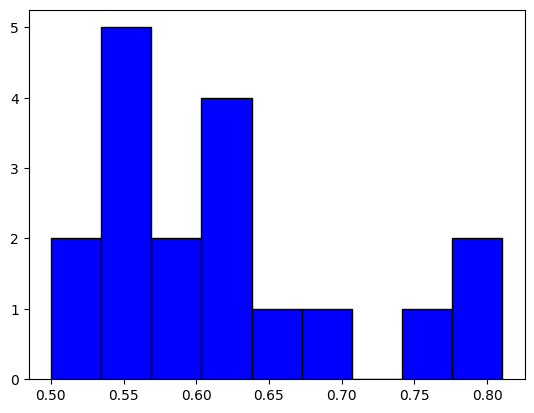

In [156]:
plt.hist(failed_cat_probs, color = 'blue', edgecolor = 'black', bins = int(len(failed_cat_probs)/2))

## Cat image, Classifier guessed as dog % spread

# how sure it is by amount of images

(array([7., 3., 2., 2., 1., 3., 2., 3., 0., 2., 1., 2., 1., 3., 0., 2., 3.,
        1., 0., 2.]),
 array([0.50198972, 0.52266547, 0.54334121, 0.56401696, 0.5846927 ,
        0.60536845, 0.6260442 , 0.64671994, 0.66739569, 0.68807143,
        0.70874718, 0.72942292, 0.75009867, 0.77077442, 0.79145016,
        0.81212591, 0.83280165, 0.8534774 , 0.87415314, 0.89482889,
        0.91550463]),
 <BarContainer object of 20 artists>)

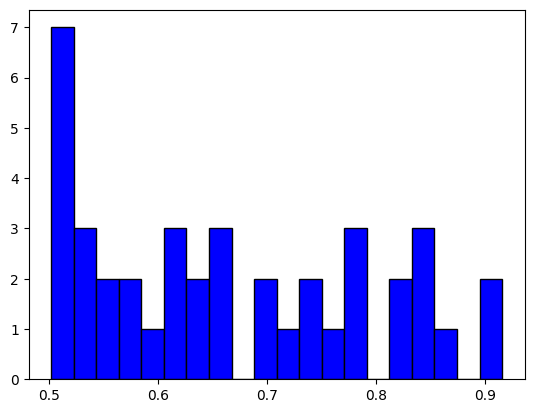

In [157]:
plt.hist(failed_dog_probs, color = 'blue', edgecolor = 'black', bins = int(len(failed_dog_probs)/2))

In [80]:
len(failed_imgs)

58

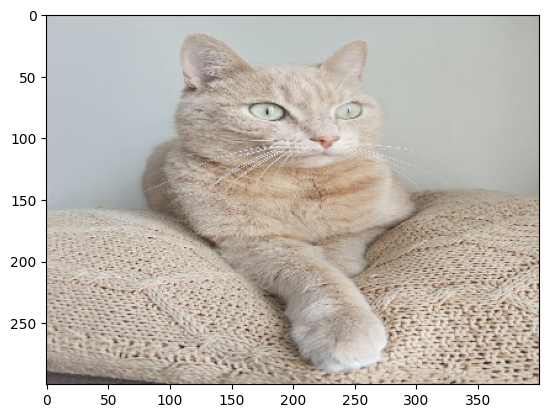

tensor(0.7130) DOG


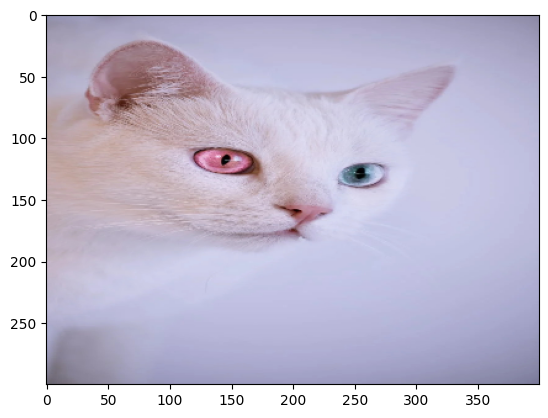

tensor(0.6066) DOG


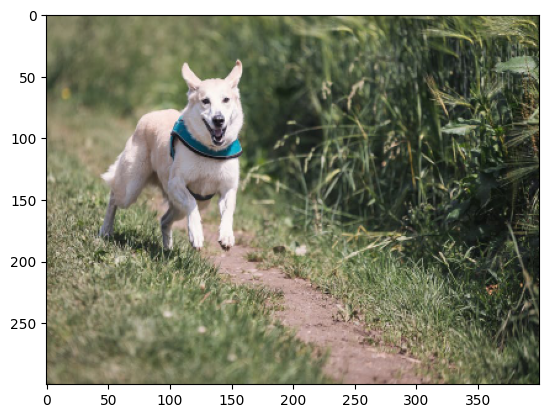

tensor(0.5440) CAT


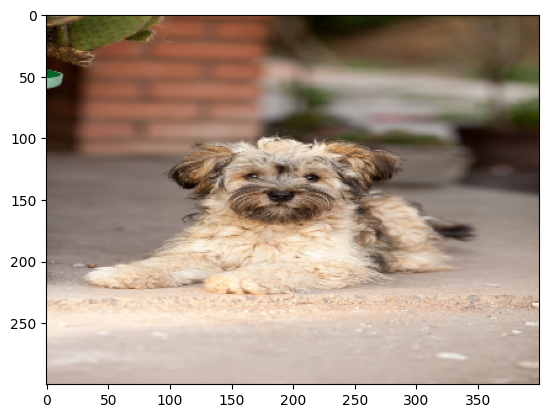

tensor(0.7013) CAT


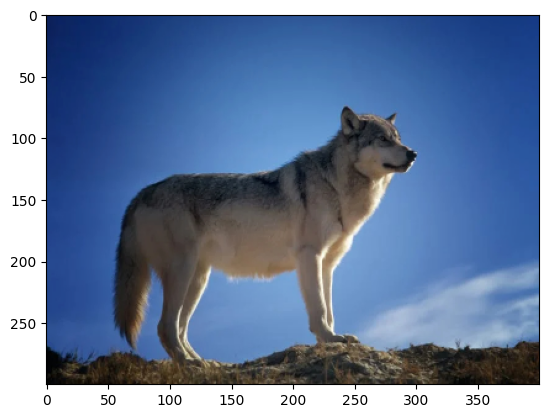

tensor(0.5424) CAT


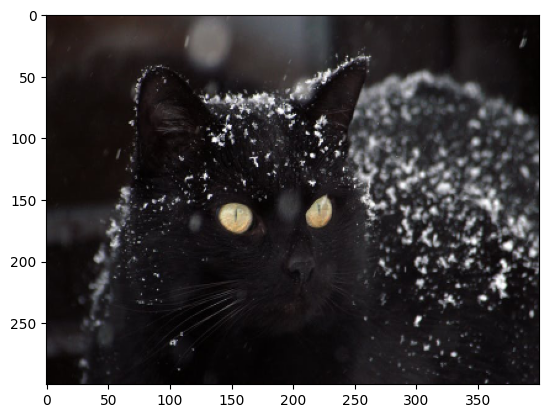

tensor(0.8242) DOG


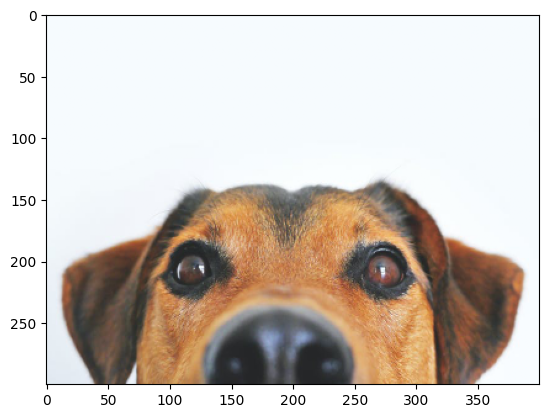

tensor(0.5175) CAT


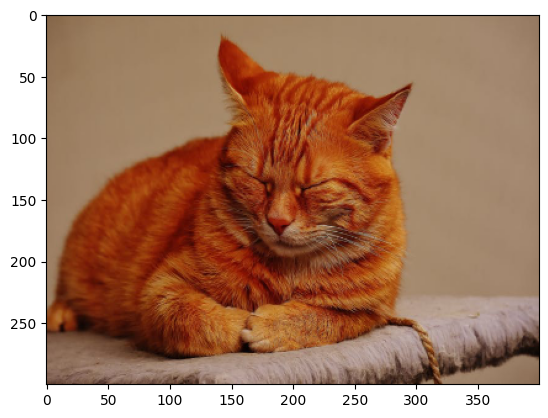

tensor(0.5205) DOG


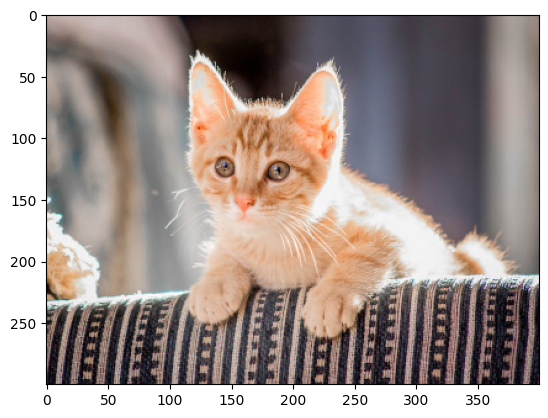

tensor(0.6204) DOG


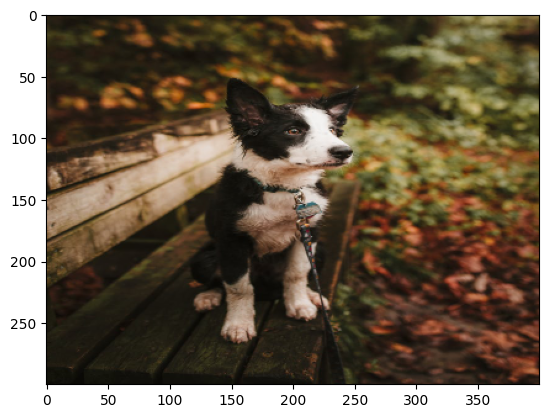

tensor(0.5386) CAT


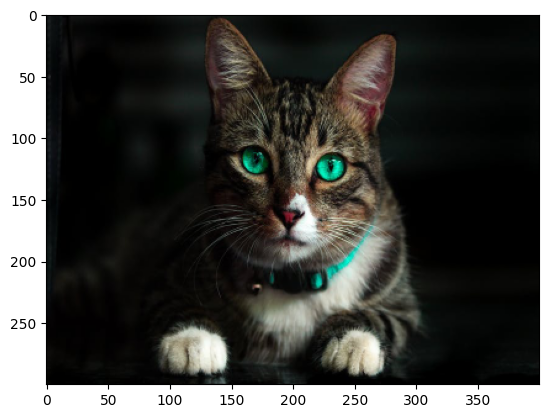

tensor(0.6316) DOG


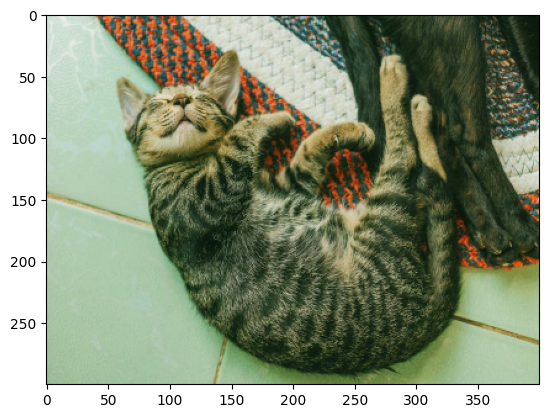

tensor(0.5787) DOG


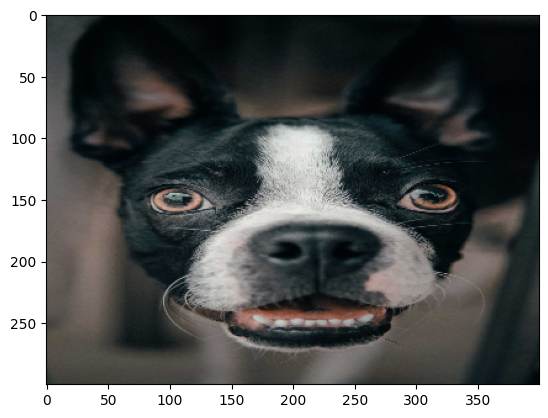

tensor(0.5547) CAT


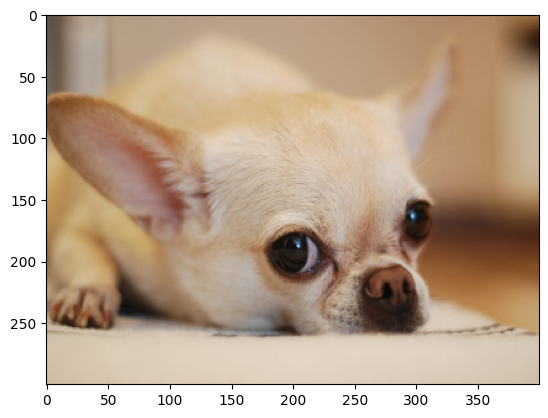

tensor(0.5994) CAT


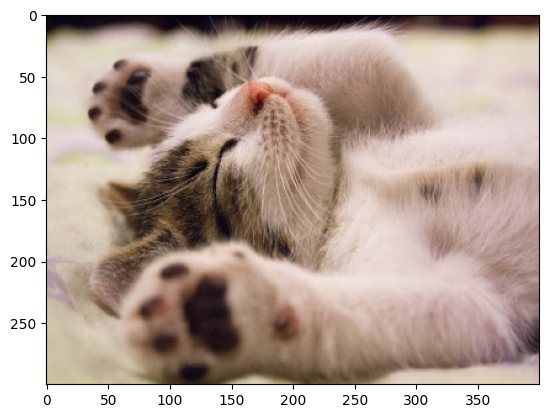

tensor(0.6515) DOG


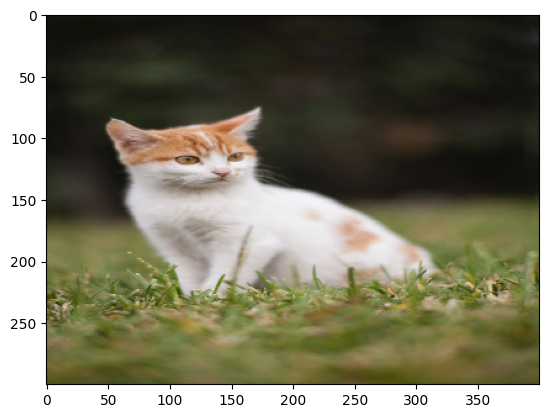

tensor(0.7865) DOG


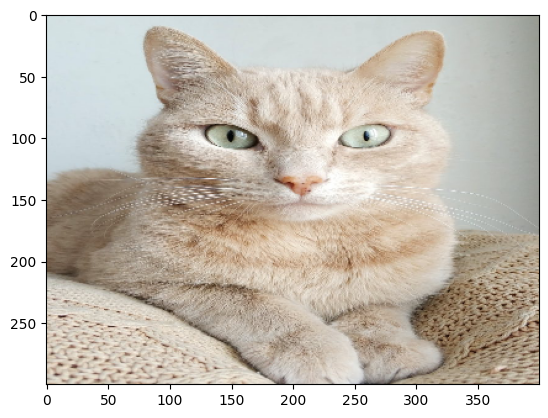

tensor(0.5624) DOG


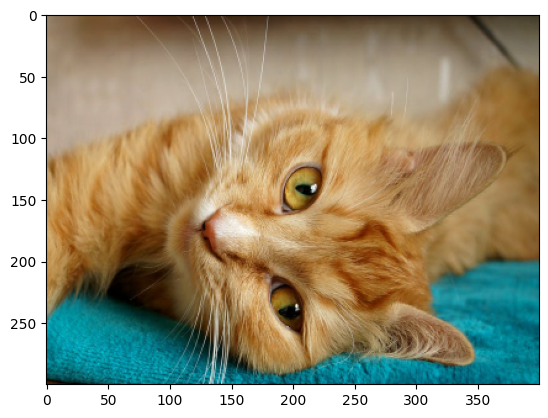

tensor(0.5134) DOG


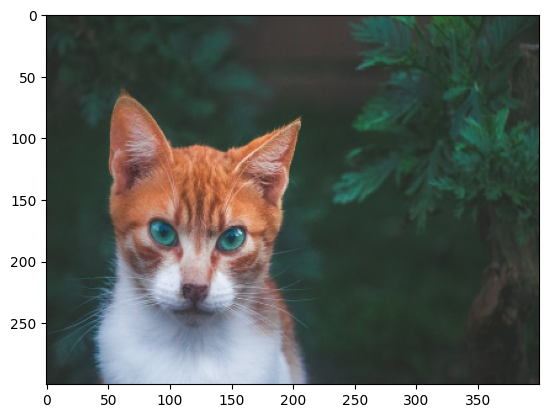

tensor(0.5020) DOG


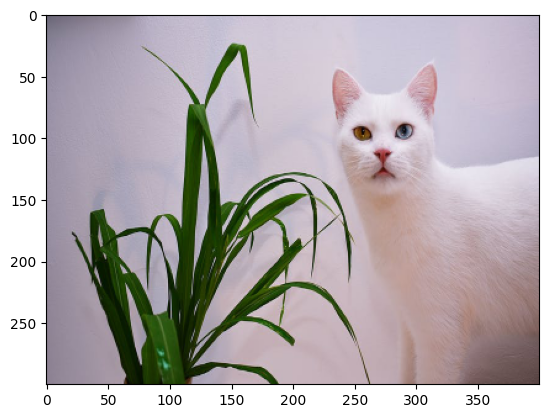

tensor(0.5915) DOG


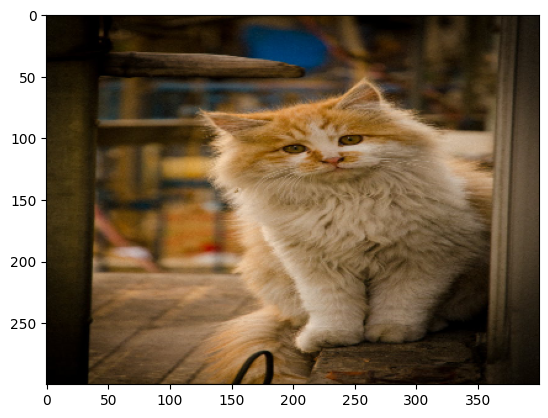

tensor(0.6545) DOG


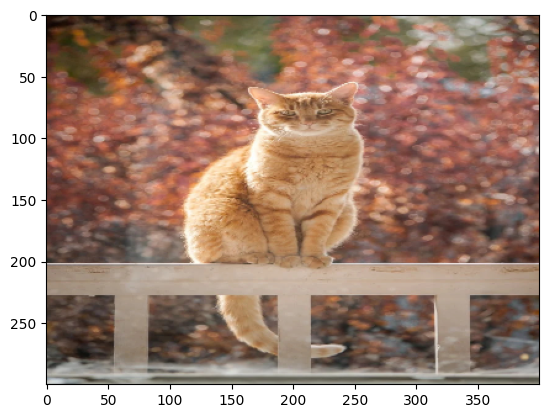

tensor(0.5450) DOG


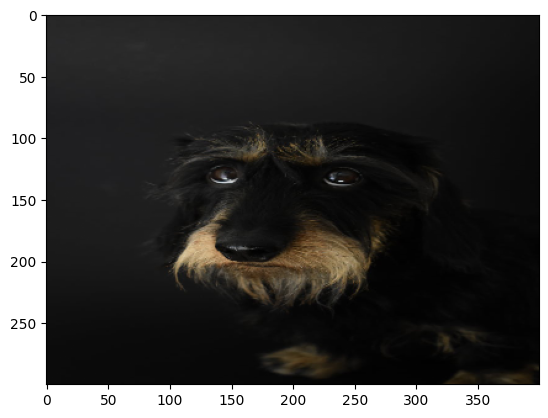

tensor(0.6213) CAT


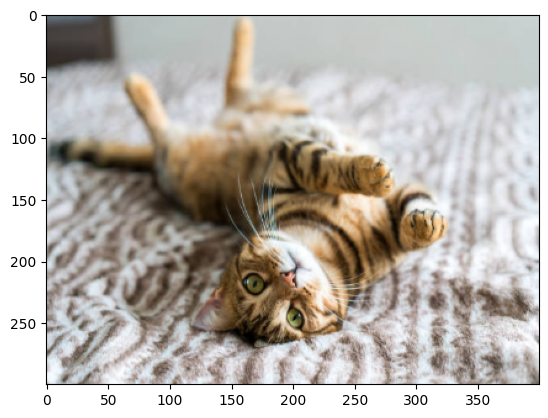

tensor(0.8620) DOG


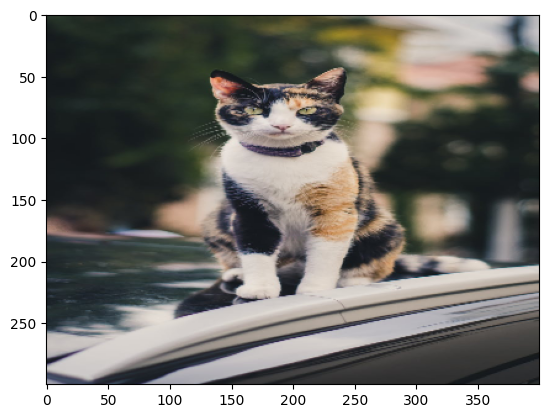

tensor(0.5255) DOG


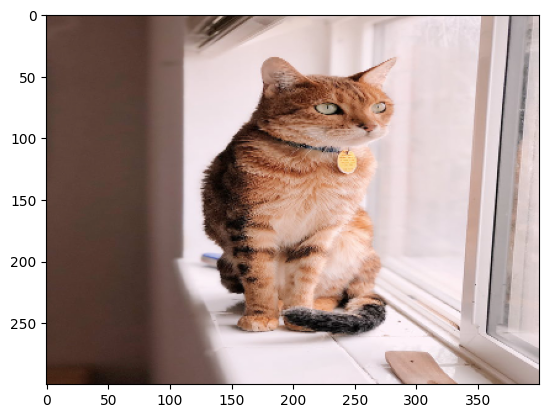

tensor(0.8382) DOG


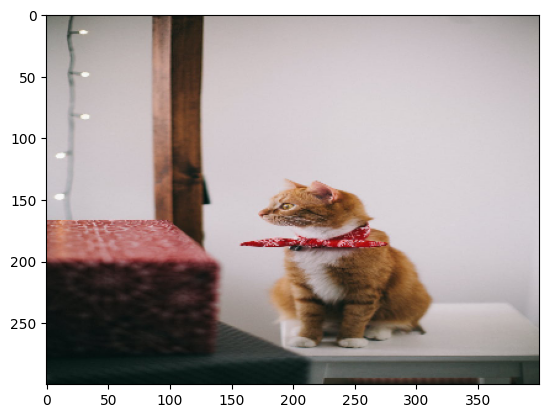

tensor(0.5163) DOG


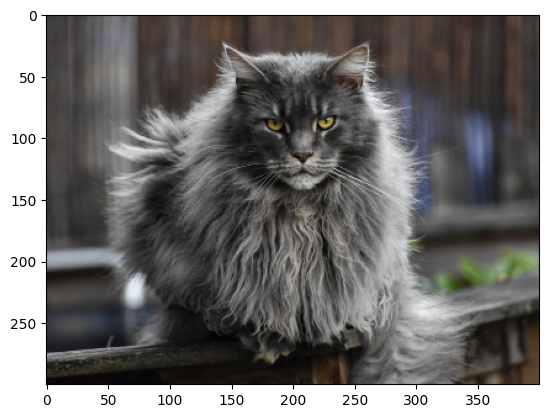

tensor(0.5107) DOG


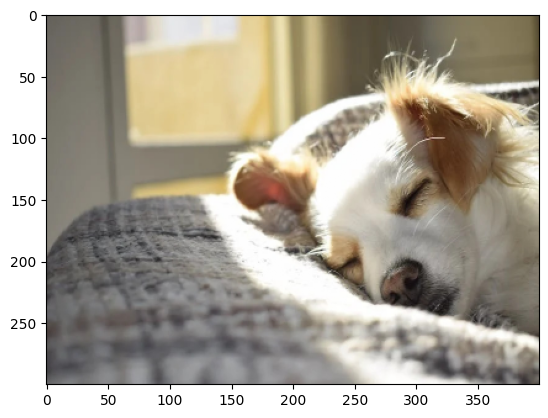

tensor(0.7916) CAT


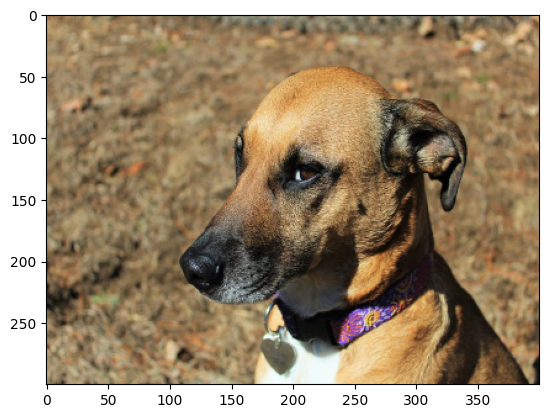

tensor(0.5002) CAT


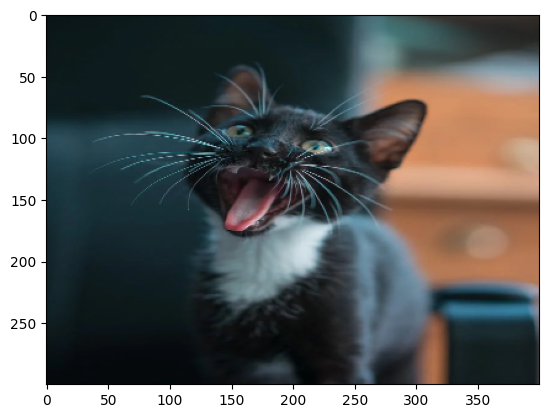

tensor(0.6566) DOG


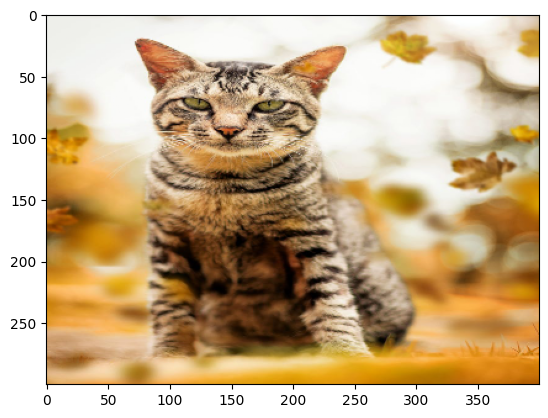

tensor(0.5029) DOG


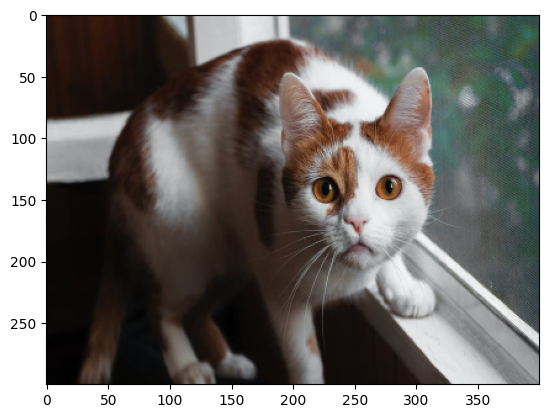

tensor(0.7394) DOG


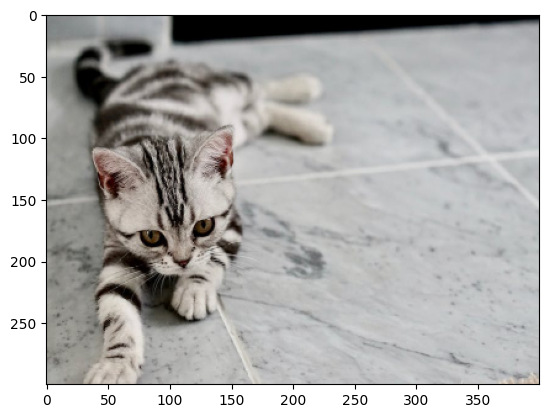

tensor(0.9155) DOG


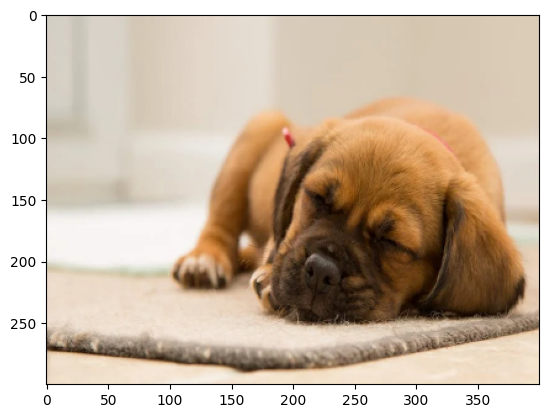

tensor(0.6370) CAT


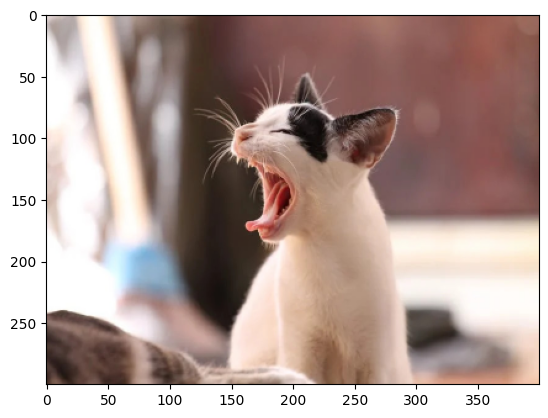

tensor(0.8375) DOG


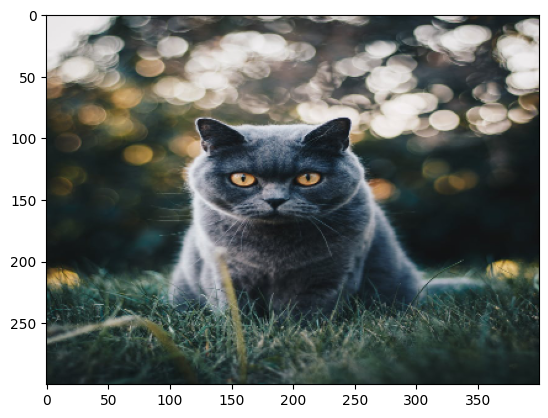

tensor(0.9151) DOG


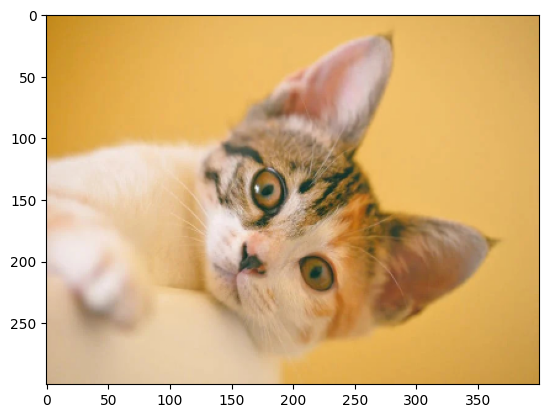

tensor(0.5277) DOG


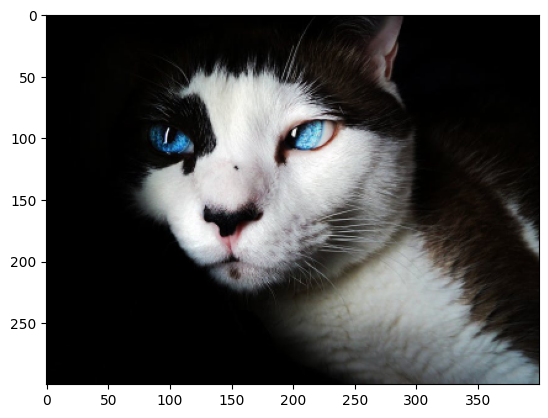

tensor(0.8484) DOG


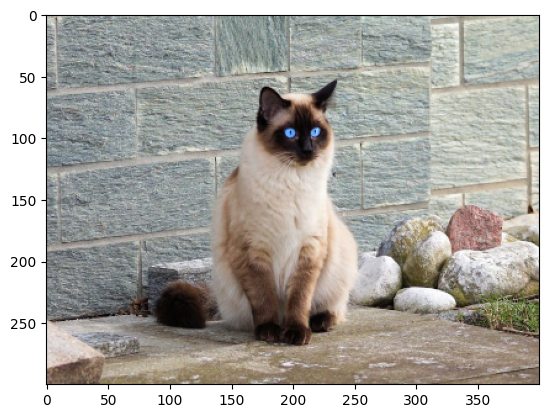

tensor(0.7868) DOG


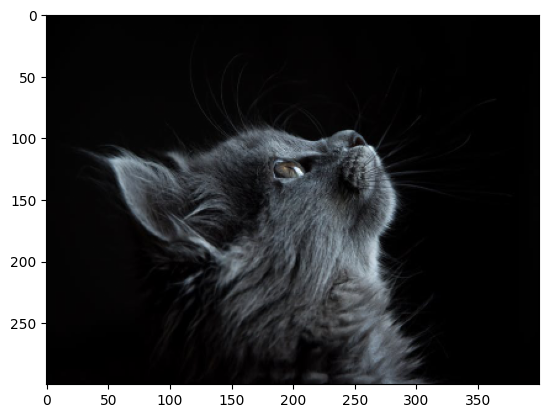

tensor(0.7776) DOG


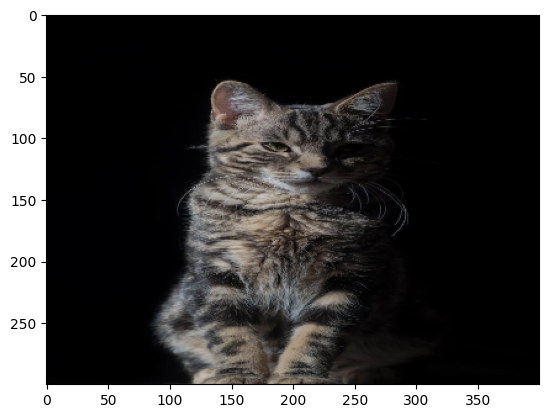

tensor(0.6929) DOG


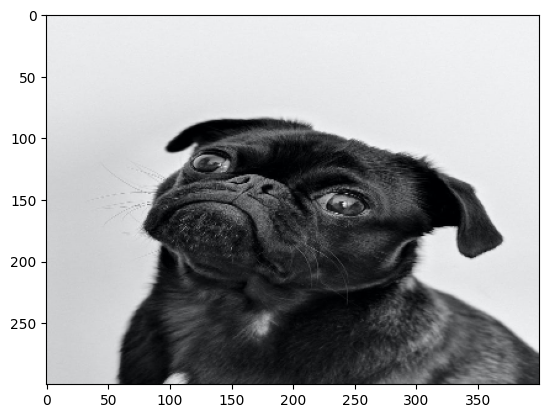

tensor(0.7516) CAT


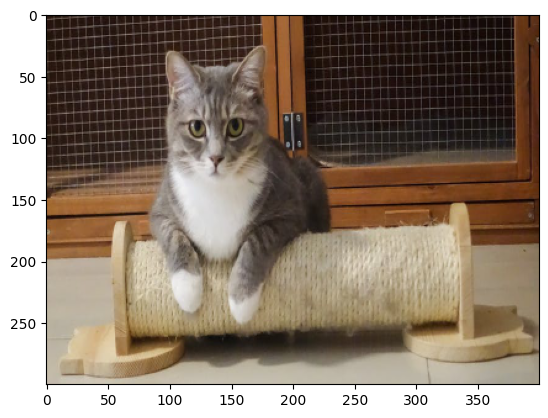

tensor(0.6902) DOG


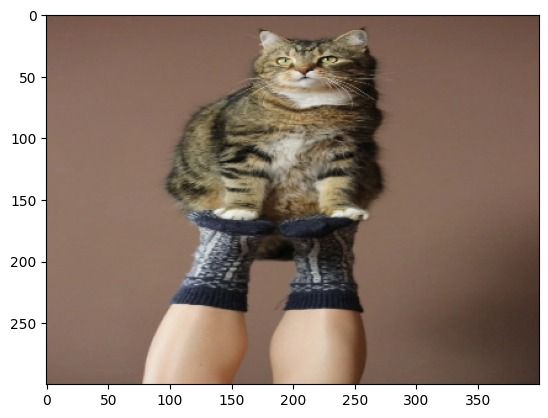

tensor(0.6385) DOG


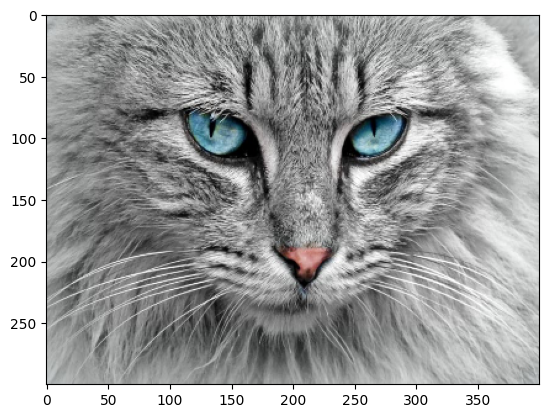

tensor(0.5188) DOG


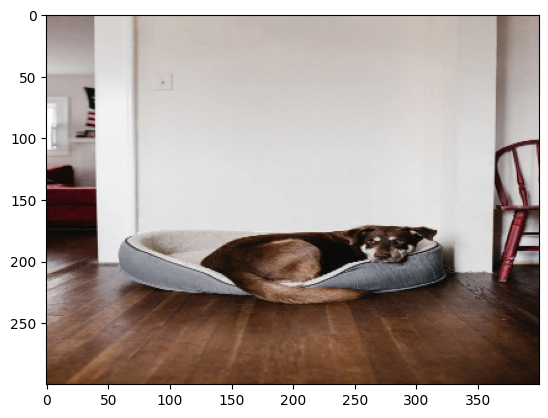

tensor(0.6253) CAT


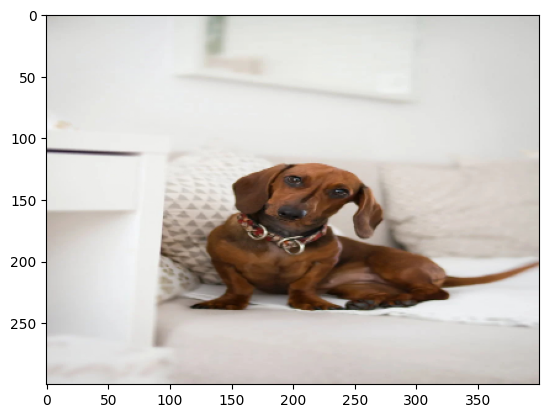

tensor(0.8103) CAT


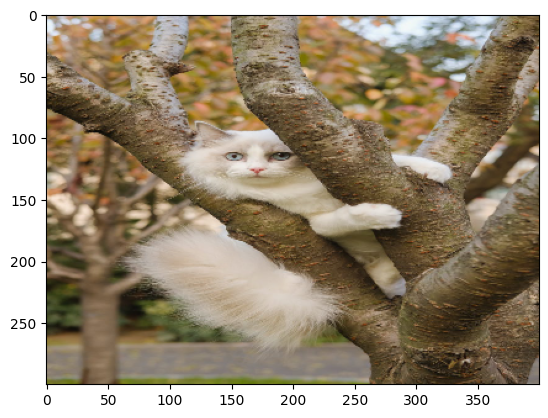

tensor(0.7560) DOG


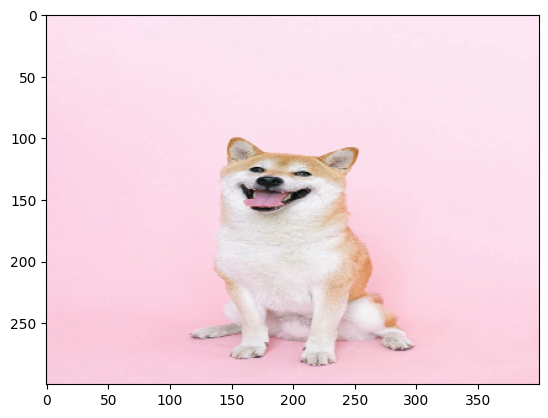

tensor(0.5775) CAT


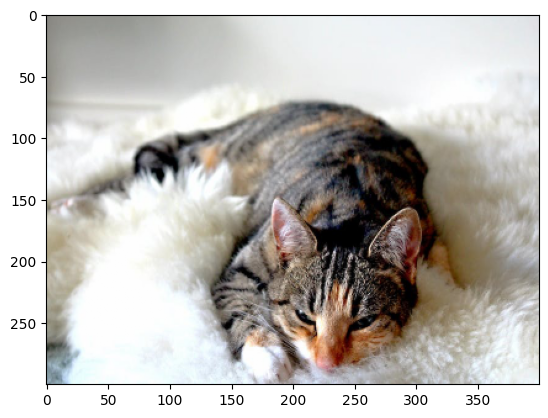

tensor(0.8300) DOG


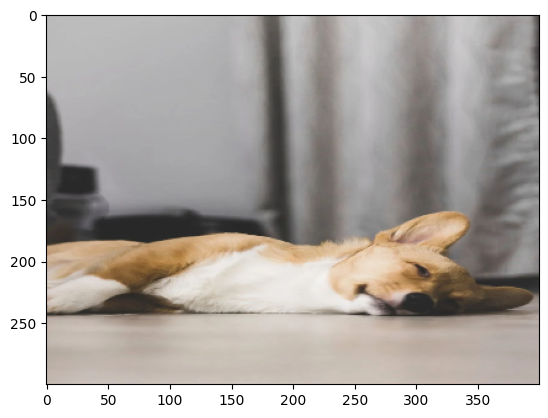

tensor(0.6556) CAT


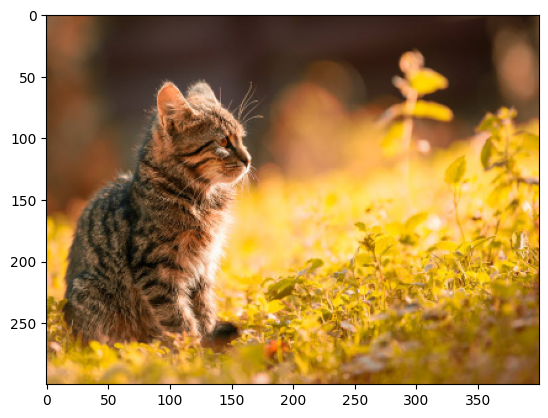

tensor(0.7428) DOG


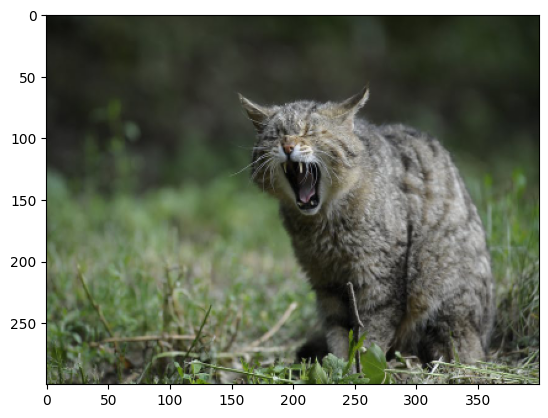

tensor(0.5279) DOG


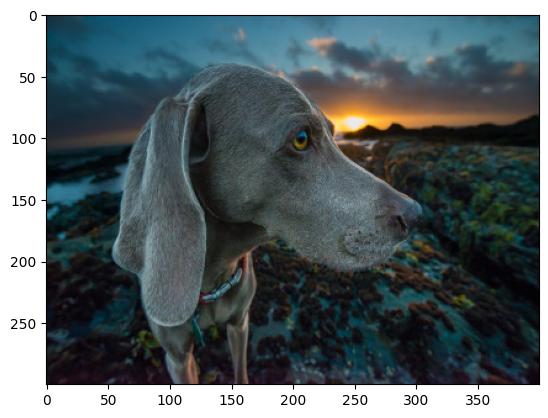

tensor(0.5606) CAT


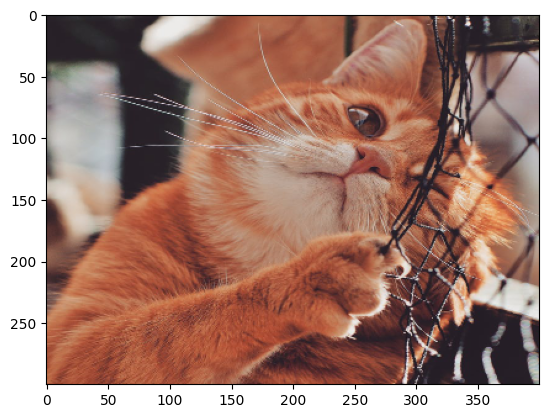

tensor(0.6200) DOG


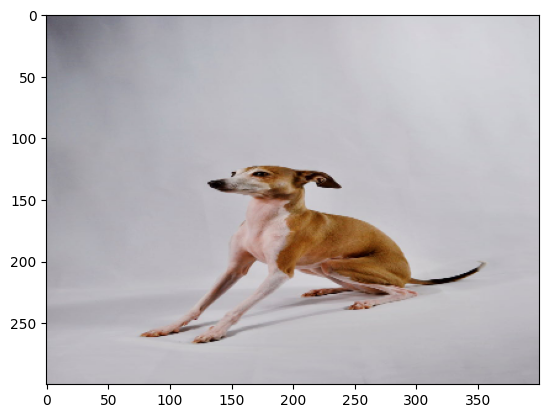

tensor(0.6235) CAT


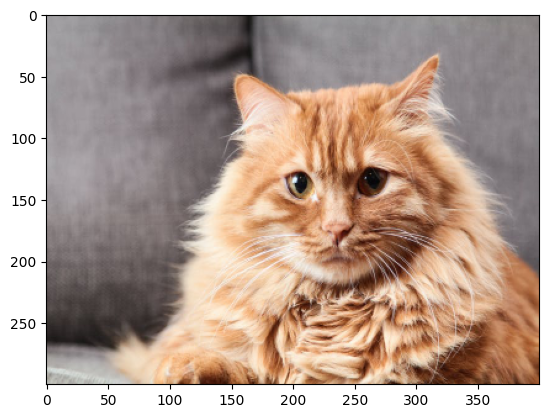

tensor(0.5756) DOG


In [154]:
for index in range(58):
    imshow(failed_imgs[index])
    print (failed_probs[index], failed_categories[index])